In [13]:
%%HTML
<script src="require.js"></script>

In [146]:
from IPython.display import HTML
HTML('''<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/
jquery.min.js "></script><script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
} else {
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);</script><form action="javascript:
code_toggle()"><input type="submit" 
value="Click here to toggle on/off the raw code."></form>
''')

In [108]:
# For Data Preprocessing
from pyspark.sql import functions as f
from pyspark.ml.stat import Correlation
from pyspark.ml.feature import VectorAssembler
import itertools
import pandas as pd
import numpy as np

# Time Series Libraries
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (mean_absolute_error,
                             mean_absolute_percentage_error)
from sklearn.ensemble import (RandomForestRegressor,
                              GradientBoostingRegressor)
import torch
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# For Visualization
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# For Spark
from pyspark.sql import SparkSession
import pyspark.pandas as ps
import h5py
import os 

# For Regression
from pyspark.ml.feature import VectorAssembler, StringIndexer, VectorIndexer
from pyspark.ml.feature import OneHotEncoder
from pyspark.sql.functions import element_at, col, flatten, explode
from pyspark.sql.types import ArrayType, DoubleType
from pyspark.ml import Pipeline
from pyspark.ml.feature import HashingTF, IDF, Tokenizer
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.regression import RandomForestRegressor, GBTRegressor
from pyspark.ml.regression import LinearRegression
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

#Helper Functions
# Define a function to format y-axis labels
def format_y_ticks(value, _):
    """Formatter of y-axis in plots."""
    if value >= 1000000:
        value = f'{value/1000000:.2f}M'
    elif value >= 1000:
        value = f'{value/1000:.0f}K'
    return value

# Figure caption
fig_num = 1


def fig_caption(title, caption):
    """Print figure caption on jupyter notebook"""
    global fig_num
    display(HTML(f"""<p style="font-size:11px;font-style:default;">
                     <center><b>
                     Figure {fig_num}. {title}.</b>
                     <br>{caption}</center></p>"""))
    fig_num += 1

In [3]:
os.environ['AWS_PROFILE'] = 'default'

spark = (SparkSession
           .builder
           .master('local[*]')
           .config('spark.jars.packages', 
                'com.amazonaws:aws-java-sdk:1.12.467,'
                'org.apache.hadoop:hadoop-aws:3.3.2')
           .config('spark.executor.extraJavaOptions', 
                '-Dcom.amazonaws.services.s3.enableV4=true')
           .config('spark.driver.extraJavaOptions',
                '-Dcom.amazonaws.services.s3.enableV4=true')
           .config('spark.hadoop.fs.s3a.aws.credentials.provider',
                   'com.amazonaws.auth.profile.ProfileCredentialsProvider,'
                   'org.apache.hadoop.fs.s3a.AnonymousAWSCredentialsProvider')
           .getOrCreate())

:: loading settings :: url = jar:file:/usr/local/spark-3.3.2-bin-hadoop3/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /home/msds2023/jdevera/.ivy2/cache
The jars for the packages stored in: /home/msds2023/jdevera/.ivy2/jars
com.amazonaws#aws-java-sdk added as a dependency
org.apache.hadoop#hadoop-aws added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-83ae9854-c4b4-4c20-bc65-57ae9c1085b5;1.0
	confs: [default]
	found com.amazonaws#aws-java-sdk;1.12.467 in central
	found com.amazonaws#aws-java-sdk-osis;1.12.467 in central
	found com.amazonaws#aws-java-sdk-core;1.12.467 in central
	found commons-logging#commons-logging;1.1.3 in central
	found commons-codec#commons-codec;1.15 in central
	found org.apache.httpcomponents#httpclient;4.5.13 in central
	found org.apache.httpcomponents#httpcore;4.4.13 in central
	found software.amazon.ion#ion-java;1.0.2 in central
	found com.fasterxml.jackson.core#jackson-databind;2.12.7.1 in central
	found com.fasterxml.jackson.core#jackson-annotations;2.12.7 in central
	found com.fasterxml.jackson.core#jackson-core

23/06/09 08:15:05 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


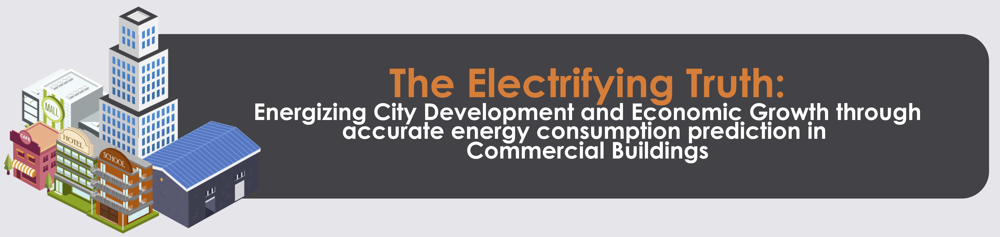

<a id='ExecSum'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Executive Summary</h1>

The study aims to address the need for accurate energy consumption predictions in commercial buildings, recognizing their significance in urban planning and fostering economic development. By equipping urban planners with the necessary tools and insights, energy use can be optimized, energy efficiency measures can be enhanced, and sustainable development can be promoted effectively.

The study utilized the Comstock dataset, which covers commercial building energy consumption in New York State for the year 2012. The dataset, amounting to 51.7GB, was processed using Apache Spark on AWS to handle the large volume of data efficiently.

The methodology employed in the study consisted of several steps, including data collection and loading, data cleaning and pre-processing, descriptive exploratory data analysis, predicting total energy consumption using regression models, and forecasting daily energy consumption using time series models.

The results of the study indicated the following key findings:

Regression models: The Gradient Boosting Model exhibited the lowest Mean Absolute Percentage Error (MAPE), indicating its superior performance in predicting total energy consumption. The top features influencing energy consumption were identified as weekday hours, number of stories or floors, and aspect ratio.
Time series models: The analysis revealed that as the complexity of the models increased, such as moving from Random Forest to Multilayer Perceptron, the time series forecasts closely resembled the true values. The naive forecast, which relies on the previous day's record, showed a shifted behavior.

To enhance the study's insights for urban planning and drive sustainable economic growth, several key recommendations are proposed. Firstly, extending the analysis period to capture seasonal variations and long-term trends in energy consumption would provide a more comprehensive understanding of energy usage patterns. Secondly, replicating the study in the Philippines, focusing on climate-matched subsets, would offer relevant insights tailored to the local context. Additionally, replicating data collection in the Philippines to gather localized energy consumption data is crucial for informed decision-making. Integrating a building carbon footprint dataset into the analysis would enable holistic urban planning by considering environmental impact alongside energy consumption. Lastly, employing explainability methods to gain deeper insights into energy consumption patterns would inform targeted interventions and policies. By implementing these recommendations, the study can provide valuable insights for urban planning and drive sustainable economic growth.

<a id='TContents'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Table of Contents</h1>

[Executive Summary](#ExecSum) <br> 
[Problem Statement](#Problem) <br> 
[Motivation](#Motiv) <br> 
[Data Source](#Source) <br>

[Methodology](#Methodology) <br>
- [Data Exploration](#DataExplore) <br> 
    - [Data Collection and Loading](#Collect)<br>
    - [Data Cleaning and Pre-processing](#Clean)<br>

- [Machine Learning Models](#MethodML)<br>
    - [Predicting Annual Energy Consumption Using Building Features](#ML1)<br>
    - [Predicting Daily Energy Consumption Using Time Series Model](#ML2)<br>

[Results and Discussion](#Results) <br>
- [Exploratory Data Analysis](#EDA)<br>
  - [Buildings](#Bldg)<br>
  - [Energy Consumption](#Energy)<br>

- [Machine Learning](#ModelR)<br>
  - [Regression Model](#Reg)<br>
  - [Time Series Model](#TS)<br>
  
[Conclusion](#Conclusion) <br> 
[Recommendation](#Recommendation1) <br> 
[References](#References) <br> 

<a id='Problem'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Problem Statement</h1>

**The problem we aim to address is the need to support urban planners to accurately predict energy consumption in commercial buildings, with the goal of fostering city development and driving economic growth.**

Urban planning plays a crucial role in shaping the development of cities and their economic viability. However, not all cities are created equal, and one contributing factor to this disparity is the presence or absence of effective urban planning strategies. Proper urban planning can create an environment that attracts investments, businesses, and fosters innovation, leading to economic growth.

Energy availability is a key determinant of successful urban planning outcomes. Without a reliable understanding of energy consumption patterns in commercial buildings, urban planners are unable to optimize energy use, enhance energy efficiency measures, and promote sustainable development effectively. Commercial buildings, being the low hanging fruits among the different building types, have the potential to significantly contribute to economic growth, making accurate energy consumption prediction in these structures particularly vital.

The absence of an accurate energy consumption prediction model for commercial buildings poses several challenges. Urban planners lack crucial insights necessary for informed decision-making, hindering their ability to allocate resources effectively and implement energy efficiency measures. Without a precise understanding of energy consumption patterns, urban planners may fail to identify opportunities for improvement and miss out on potential energy-saving initiatives.

[Back to Table of Contents](#TContents)

<a id='Motiv'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Motivation</h1>

The motivation behind our endeavor stems from the recognition that accurate energy consumption predictions for commercial buildings are crucial in supporting urban planners and driving economic growth in our country. By providing urban planners with the necessary tools and insights, we can optimize energy use, enhance energy efficiency measures, and promote sustainable development effectively.

Economic growth is a fundamental objective for any nation. Urban areas serve as the hubs of economic activity, attracting investments, fostering innovation, and creating job opportunities. However, to ensure sustainable and inclusive economic growth, it is imperative to optimize energy consumption within commercial buildings. By accurately predicting energy consumption, urban planners can allocate resources efficiently, identify areas for improvement, and implement targeted energy-saving initiatives. This not only reduces operational costs for businesses but also attracts further investments and enhances the overall economic competitiveness of cities.

[Back to Table of Contents](#TContents)

<a id='Source'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Data Source</h1>

**ComStock Database**

ComStock is a U.S. Department of Energy (DOE) model of the U.S. commercial building stock, developed and maintained by NREL. The model takes some building characteristics from the DOE Commercial Prototype Building Models and Commercial Reference Building. However, unlike many other building stock models, ComStock also combines these with a variety of additional public and private-sector data sets. Collectively, this information provides high-fidelity building stock representation with a realistic diversity of building characteristics. The dataset is a highly granular, bottom-up model that uses multiple data sources, statistical sampling methods, and advanced building energy simulations to estimate the annual sub-hourly energy consumption of the commercial building stock across the United States.

The commercial (ComStock) dataset represents 14 of the most common commercial building types – small office, medium office, large office, retail, strip mall, warehouse, primary school, secondary school, full-service restaurant, quick-service restaurant, small hotel, large hotel, hospital, and outpatient – which comprise about 65% of the commercial sector floor area in the United States according to CBECS. The measurements is taken with a 15-minute interval for all the building models. The data available in AWS are only for one year from the period of January 2012 to December 2012.

Amazon Resource Name (ARN): arn:aws:s3:::nrel-pds-building-stock/comstock/<br>
AWS CLI Access: aws s3 ls --no-sign-request s3://nrel-pds-building-stock/comstock/

**Database Summary:** <span style="font-size: 10px">[1][2]</span>
- 2.1 TB File Size
- 56 states
- 15 climate zones
- 14+ building types
- 350,000+ building samples

**Original Data Source**

The entire ComStock dataset is also available as a public dataset on the Registry of Open Data on Amazon Web Services (AWS). The data is updated annually and managed by the National Renewable Energy Laboratory.

The dataset can be accessed here: https://registry.opendata.aws/nrel-pds-building-stock/

**For this study, in order to optimize computational efficiency and meet the file size requirement (50G), the team chose to focus on the data on New York State which has a state code of 36.**

[Back to Table of Contents](#TContents)

In [4]:
# Energy consumption
!aws s3 ls --no-sign-request s3://nrel-pds-building-stock/comstock/athena/2020/comstock_v1/state/upgrade=88/state=36/ --human-readable --summarize | tail -8

2021-01-23 16:14:43    2.3 MiB 99915-88.parquet
2021-01-23 16:14:43    2.3 MiB 99927-88.parquet
2021-01-23 16:14:43    2.0 MiB 99951-88.parquet
2021-01-23 16:14:43    3.6 MiB 99955-88.parquet
2021-01-23 16:14:43    1.8 MiB 99973-88.parquet

Total Objects: 19355
   Total Size: 51.7 GiB


In [5]:
# Building characteristics
!aws s3 ls --no-sign-request s3://nrel-pds-building-stock/comstock/athena/2020/comstock_v1/metadata/ --human-readable --summarize | tail -8

2021-01-23 06:01:08  621.5 MiB fast6_metadata.parquet
2021-01-23 06:01:08  627.1 MiB fast7_metadata.parquet
2021-01-23 06:01:08  590.2 MiB fast8_metadata.parquet
2021-01-23 06:01:08    9.7 MiB fast9_metadata.parquet
2021-01-23 06:01:08   87.6 MiB slow_metadata.parquet

Total Objects: 10
   Total Size: 4.9 GiB


<a id='Methodology'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Methodology</h1>

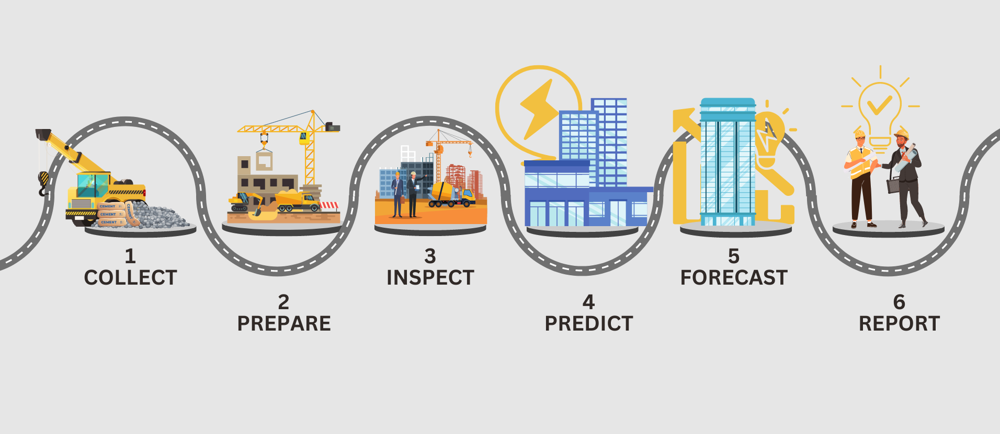



<span style="font-size: 16px">
    <center><b>Table 1. Methodology Details</b></center> 
    <center><b>Provides a complete and explicit pipeline overview of the methodology.</b></center>
</span>

<table >
    <tr style="color:#E6E7E9; font-size:16px; background-color:#424242">
        <th style="text-align: center">Journey</th>
        <th style="text-align: center">Task</th>
        <th style="text-align: center">Steps</th>
    </tr>
    <tr>
        <td style="color:#424242; font-size:14px; font-weight:bold; text-align: left">COLLECT</td>
        <td style="text-align: left; font-size:14px; font-weight:bold; color:#000080;">Data Collection and Loading</td>
        <td style="font-size:13px; text-align: left"><ul>
            <li>Examine data structure and characteristics.</li>
            <li>Load only the ComStock Dataset for New York State.</li>
            <li>Check for Null data.</li>
            <li>Check for unwanted outliers.</li>
            </ul></td>
    </tr>
    <tr>
        <td style="color:#424242; font-size:14px; font-weight:bold; text-align: left">PREPARE</td>
        <td style="text-align: left; font-size:14px; font-weight:bold; color:#000080;">Data Cleaning and Pre-Processing</td>
        <td style="font-size:13px; text-align: left"><ul>
            <li>Filter and select columns that will be analyzed from the original dataset.</li>
            <li>Perform null value imputation per column.</li>
            <li>Perform removal of duplicate data.</li>
            </ul></td>
    </tr>
    <tr>
        <td style="color:#424242; font-size:14px; font-weight:bold; text-align: left">INSPECT</td>
        <td style="text-align: left; font-size:14px; font-weight:bold; color:#000080;">Descriptive Exploratory Data Analysis</td>
        <td style="font-size:13px; text-align: left"><ul>
            <li>Create visualizations that summarizes the data.</li>
            <li>Discover correlations and relationships between variables in your data.</li>
            </ul></td>
    </tr>
    <tr>
        <td style="color:#424242; font-size:14px; font-weight:bold; text-align: left">PREDICT</td>
        <td style="text-align: left; font-size:14px; font-weight:bold; color:#000080;">Predicting Total Energy Consumption Using Regression Model</td>
        <td style="font-size:13px; text-align: left"><ul>
            <li>Further pre-processing of data to be used in the machine learning models</li>
            <li>Split the data into train and test splits</li>
            <li>Train the chosen models</li>
            <li>Test the accuracy of the models</li>
            <li>Optimize the parameters of the models by hypertuning</li>
            </ul></td>
    </tr>
    <tr>
        <td style="color:#424242; font-size:14px; font-weight:bold; text-align: left">FORECAST</td>
        <td style="text-align: left; font-size:14px; font-weight:bold; color:#000080;">Forecasting Daily Energy Consumption Using Time Series Model</td>
        <td style="font-size:13px; text-align: left"><ul>
            <li>Further pre-processing of data to be used in the machine learning models</li>
            <li>Split the data into train and test splits</li>
            <li>Train the chosen models</li>
            <li>Test the accuracy of the models</li>
            <li>Optimize the parameters of the models by hypertuning</li>
            </ul></td>
    </tr>
    <tr>
        <td style="color:#424242; font-size:14px; font-weight:bold; text-align: left">REPORT</td>
         <td style="text-align: left; font-size:14px; font-weight:bold; color:#000080;">Report Insights</td>
        <td style="font-size:13px; text-align: left"><ul>
            <li>Interpret visualizations from the Descriptive Exploratory Data Analysis.</li>
            <li>Interpret results from the Machine Learning Models.</li>
            <li>Provide use cases that are applicable to the data.</li>
            </ul></td>
    </tr>
</table>
<br>

[Back to Table of Contents](#TContents)

<a id='DataExplore'></a>
<h2 style="color:#424242; background-color: #ffffff; border: 1px solid #ffffff; padding: 10px 0;">Data Exploration</h2>

***

<a id='Collect'></a>
<h3 style="color:#424242; background-color: #ffffff; border: 1px solid #ffffff; padding: 10px 0;">Data Collection and Loading</h3>

<span style="font-size: 16px">
    <center><b>Table 2. ComStock Raw Energy Data Description</b><span style="font-size: 10px">[5]</span></center> 
</span>

<center>Rows: 678,164,160<br>
Columns: 98<br>
Without Null Values</center>

<table >
    <tr style="color:#E6E7E9; font-size:14px; background-color:#424242">
        <th style="text-align: center">Variable Name</th>
        <th style="text-align: center">Data Type</th>
        <th style="text-align: center">Variable Category</th>
        <th style="text-align: center">Description</th>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">timestamp</td>
        <td style="font-size:12px; text-align: left">timestamp</td>
        <td style="font-size:12px; text-align: left">datetime</td>
        <td style="font-size:12px; text-align: left">Date and time the energy consumption of the building is measured in Eastern Standard Time (EST)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">bldg_id</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Building id, mapping key between metadata and timeseries data</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.cooling.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric cooling systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.cooling.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric cooling systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.cooling.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric cooling systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.cooling.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric cooling systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.exterior_lighting.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric exterior lighting systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.exterior_lighting.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric exterior lighting systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.exterior_lighting.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric exterior lighting systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.exterior_lighting.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric exterior lighting systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.fans.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric fan systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.fans.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric fan systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.fans.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric fan systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.fans.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric fan systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_recovery.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heat recovery systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_recovery.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heat recovery systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_recovery.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric heat recovery systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_recovery.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric heat recovery systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_rejection.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heat rejection systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_rejection.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heat rejection systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_rejection.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric heat rejection systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heat_rejection.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric heat rejection systems relative to building size in kWh/sqft</td></tr> 
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heating.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heating systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heating.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heating systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heating.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric heating systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.heating.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric heating systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.humidification.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric humidification systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.humidification.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric humidification systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.humidification.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric humidification systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.humidification.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric humidification systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_equipment.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric interior equipment systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_equipment.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric interior equipment systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_equipment.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric interior equipment systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_equipment.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric interior equipment systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_lighting.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric interior lighting systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_lighting.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric interior lighting systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_lighting.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric interior lighting systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.interior_lighting.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric interior lighting systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.peak_demand.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric peak demand systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.peak_demand.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric peak demand systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.peak_demand.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric peak demand systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.peak_demand.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric peak demand systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.pumps.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric pump systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.pumps.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric pump systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.pumps.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric pump systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.pumps.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric pump systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.refrigeration.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric refrigeration systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.refrigeration.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric refrigeration systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.refrigeration.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric refrigeration systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.refrigeration.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric refrigeration systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.total.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed by electric systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.total.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed by electric systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.total.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved by electric systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.total.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved by electric systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.water_systems.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric water systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.water_systems.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric water systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.water_systems.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric water systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.electricity.water_systems.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by electric water systems relative to building size in kWh/sqft</td>
    </tr> 
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.cooling.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered cooling systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.cooling.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered cooling systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.cooling.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered cooling systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.cooling.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered cooling systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.heating.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered heating systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.heating.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered heating systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.heating.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered heating systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.heating.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered heating systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.interior_equipment.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered interior equipment systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.interior_equipment.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered interior equipment systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.interior_equipment.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered interior equipment systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.interior_equipment.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered interior equipment systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.total.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed by natural gas systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.total.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed by natural gas systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.total.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved by natural gas systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.total.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved by natural gas systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.water_systems.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered water systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.water_systems.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by natural gas powered water systems relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.water_systems.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered water systems in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.natural_gas.water_systems.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by natural gas powered water systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.heating.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by heating systems powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.heating.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by heating systems powered by other fuel types relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.heating.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by heating systems powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.heating.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by heating systems powered by other fuel types relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.interior_equipment.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by interior equipment powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.interior_equipment.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by interior equipment powered by other fuel types relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.interior_equipment.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by interior equipment powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.interior_equipment.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by interior equipment powered by other fuel types systems relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.total.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed by systems powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.total.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed by systems powered by other fuel types relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.total.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved by systems powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.total.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved by systems powered by other fuel types relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.water_systems.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by water systems powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.water_systems.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by water systems powered by other fuel types relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.water_systems.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by water systems powered by other fuel types in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.other_fuel.water_systems.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy saved by water systems powered by other fuel types relative to building size in kWh/sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.site_energy.total.energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.site_energy.total.energy_consumption_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed relative to building size in kWh/sqft</td>
    </tr>
        <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.site_energy.total.energy_savings</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved in kWh</td>
            <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out.site_energy.total.energy_savings_intensity</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy saved relative to building size in kWh/sqft</td>
    </tr>
</table>

In [6]:
# Load Energy Dataset
energy = spark.read.parquet('s3a://nrel-pds-building-stock/comstock/athena/2020/comstock_v1/state/upgrade=88/state=36/')
energy.limit(5).toPandas()

23/06/09 08:16:11 WARN MetricsConfig: Cannot locate configuration: tried hadoop-metrics2-s3a-file-system.properties,hadoop-metrics2.properties


23/06/09 08:16:32 WARN package: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


/usr/local/spark/python/pyspark/sql/pandas/conversion.py:248: FutureWarning: Passing unit-less datetime64 dtype to .astype is deprecated and will raise in a future version. Pass 'datetime64[ns]' instead
  series = series.astype(t, copy=False)


,timestamp,bldg_id,out.electricity.cooling.energy_consumption,out.electricity.cooling.energy_consumption_intensity,out.electricity.cooling.energy_savings,out.electricity.cooling.energy_savings_intensity,out.electricity.exterior_lighting.energy_consumption,out.electricity.exterior_lighting.energy_consumption_intensity,out.electricity.exterior_lighting.energy_savings,out.electricity.exterior_lighting.energy_savings_intensity,...,out.other_fuel.total.energy_savings,out.other_fuel.total.energy_savings_intensity,out.other_fuel.water_systems.energy_consumption,out.other_fuel.water_systems.energy_consumption_intensity,out.other_fuel.water_systems.energy_savings,out.other_fuel.water_systems.energy_savings_intensity,out.site_energy.total.energy_consumption,out.site_energy.total.energy_consumption_intensity,out.site_energy.total.energy_savings,out.site_energy.total.energy_savings_intensity
0,2012-01-01 00:00:00,74395,16.918239,0.000048,0.0,0.0,7.465842,0.000021,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,243.637461,0.000696,0.052855,1.510146e-07
1,2012-01-01 00:15:00,74395,16.466621,0.000047,0.0,0.0,7.465842,0.000021,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,237.706212,0.000679,0.052855,1.510146e-07
2,2012-01-01 00:30:00,74395,15.842685,0.000045,0.0,0.0,7.465842,0.000021,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,228.048962,0.000652,0.052855,1.510146e-07
3,2012-01-01 00:45:00,74395,15.728232,0.000045,0.0,0.0,7.465842,0.000021,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,217.640946,0.000622,0.052855,1.510146e-07
4,2012-01-01 01:00:00,74395,15.313667,0.000044,0.0,0.0,7.465842,0.000021,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,214.577385,0.000613,0.052855,1.510146e-07


[Back to Table of Contents](#TContents)

<span style="font-size: 16px">
    <center><b>Table 3. ComStock Raw Building Data Description</b><span style="font-size: 10px">[5]</span></center> 
</span>

<center>Rows: 336,946<br>
Columns: 128<br>
Without Null Values</center>

<table >
    <tr style="color:#E6E7E9; font-size:14px; background-color:#424242">
        <th style="text-align: center">Variable Name</th>
        <th style="text-align: center">Data Type</th>
        <th style="text-align: center">Variable Category</th>
        <th style="text-align: center">Description</th>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">applicablity</td>
        <td style="font-size:12px; text-align: left">boolean</td>
        <td style="font-size:12px; text-align: left">boolean</td>
        <td style="font-size:12px; text-align: left">Indicates whether a simulation is valid or has applicable results for a given upgrade or baseline. Apply simulation output reporting measure</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">bldg_id</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Building id, mapping key between metadata and timeseries data</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">climate_zone</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Building energy code climate zone based on International Energy Conservation Code (IECC)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_aspect_ratio</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Overall length in the east–west direction divided by the overall length in the north–south direction</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_building_type</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Commercial Buildings Energy Consumption Survey (CBECS)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_climate_zone</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Building energy code climate zone based on International Energy Conservation Code (IECC)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_code_when_built</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Timeline when the building was constructed</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_cooling_fuel</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of fuel or energy used to power cooling systems</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_current_envelope_code</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of physical separator between the interior and the exterior environments of a building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_current_exterior_lighting_code</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of exterior lighting system used in the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_current_hvac_code</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of Heating, Ventilation, and Air Conditioning (HVAC) system used in the building categorized by timeline</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_current_interior_equipment_code</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of interior equipment system used in the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_current_interior_lighting_code</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of interior lighting system used in the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_floor_height</td>
        <td style="font-size:12px; text-align: left">integer</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Floor-to-floor heights found in the US Department of Energy (DOE) prototype buildings,</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_heating_fuel</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of fuel or energy used to power heating systems</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_hvac_delivery_type</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of HVAC delivery system used in the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_hvac_system_type</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of Heating, Ventilation, and Air Conditioning (HVAC) system used in the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_number_of_stories</td>
        <td style="font-size:12px; text-align: left">integer</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Building number of stories above grade</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_rotation</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Building rotation off of north axis (positive value is clockwise)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_sqft</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total area of the building in sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_water_systems_fuel</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of fuel or energy used to power water systems</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_weather_station</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Station where weather data is collected</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_weekday_opening_time</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Time of the day a building starts to operate from Monday to Friday</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_weekday_operating_hours</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Operating time of a building from Monday to Friday</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_weekend_opening_time</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Time of the day a building starts to operate from Saturday to Sunday</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_weekend_operating_hours</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Operating time of a building from Saturday to Sunday</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">state</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">US state where the building is located</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">upgrade</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">revision number of the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">weight</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Prevalance of the building in the US commercial stock</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">metadata_index</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Metadata_index of the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_applicable</td>
        <td style="font-size:12px; text-align: left">boolean</td>
        <td style="font-size:12px; text-align: left">boolean</td>
        <td style="font-size:12px; text-align: left">Apply simulation output reporting measure</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">__index_level_0__</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Apply simulation output reporting measure</td>
    </tr>
</table>

***Note: Remaining columns are the same column description in Table 1 but measured as annualized energy consumption of each building***

In [7]:
# Load dataset
building = (spark
 .read
 .parquet('s3a://nrel-pds-building-stock/comstock/athena/2020/comstock_v1/'
          'metadata/fast*.parquet'))
building.limit(5).toPandas()

,applicability,bldg_id,climate_zone,in.aspect_ratio,in.building_type,in.climate_zone,in.code_when_built,in.cooling_fuel,in.current_envelope_code,in.current_exterior_lighting_code,...,out.site_energy.total.energy_consumption,out.site_energy.total.energy_consumption_intensity,out.site_energy.total.energy_savings,out.site_energy.total.energy_savings_intensity,state,upgrade,weight,metadata_index,in.applicable,__index_level_0__
0,True,1,1A,1.0,FullServiceRestaurant,ASHRAE 169-2013-1A,pre_1978,Electricity,1978_1993,2002_2006,...,138457.827742,138.457828,0.0,0.0,12,0,11.590606,0,True,0
1,True,2,1A,1.0,FullServiceRestaurant,ASHRAE 169-2013-1A,pre_1978,Electricity,1978_1993,2002_2006,...,138968.936987,138.968937,0.0,0.0,12,0,11.590606,1,True,1
2,True,3,4A,2.0,RetailStripmall,ASHRAE 169-2013-4A,pre_1978,Electricity,pre_1978,2006_2010,...,903338.368043,24.089023,0.0,0.0,36,0,2.110621,2,True,2
3,True,4,3A,2.0,Warehouse,ASHRAE 169-2013-3A,1978_1993,Electricity,pre_1978,2010_2014,...,210868.674438,5.623165,0.0,0.0,45,0,2.108605,3,True,3
4,True,5,5A,3.0,RetailStandalone,ASHRAE 169-2013-5A,pre_1978,Electricity,1978_1993,2010_2014,...,840796.929752,22.421251,0.0,0.0,18,0,2.816749,4,True,4


[Back to Table of Contents](#TContents)

<a id='Clean'></a>
<h3 style="color:#424242; background-color: #ffffff; border: 1px solid #ffffff; padding: 10px 0;">Data Cleaning and Pre-processing</h3>

In order to arrive at the Final Dataset to be used for exploration, the following steps were taken:
1. Rename columns by replacing names that has a period `.` with underscore `_` to easily access columns.
2. Filter buildings that are in `New York State` which is `state=36`.
3. Filter rows that have non-zero values for `out_electricity_total_energy_consumption`
4. Select columns `bldg_id` and features that are critical in the computation of `out_electricity_total_energy_consumption`.
5. Transform `in_weekday_operating_hours` and `in_weekdend_operating_hours` into decimal form then covert to type `double`.

<br>

<span style="font-size: 16px">
    <center><b>Table 4. Final Building Features Data Description</b></center>
</span>

<center>Rows: 336,946<br>
Columns: 10<br>
No Null Values</center>

<table >
    <tr style="color:#E6E7E9; font-size:14px; background-color:#424242">
        <th style="text-align: center">Variable Name</th>
        <th style="text-align: center">Original Data Type</th>
        <th style="text-align: center">Final Data Type</th>
        <th style="text-align: center">Description</th>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">bldg_id</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Building id, mapping key between metadata and timeseries data</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">climate_zone</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Building energy code climate zone based on International Energy Conservation Code (IECC)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_building_type</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Commercial Buildings Energy Consumption Survey (CBECS)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">area</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total area of the building in sqft</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_number_of_stories</td>
        <td style="font-size:12px; text-align: left">integer</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Building number of stories above grade</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_aspect_ratio</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Overall length in the east–west direction divided by the overall length in the north–south direction</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_hvac_system_type</td>
        <td style="font-size:12px; text-align: left">string</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Type of Heating, Ventilation, and Air Conditioning (HVAC) system used in the building</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_weekday_operating_hours</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Operating time of a building from Monday to Friday</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">in_weekend_operating_hours</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Operating time of a building from Saturday to Sunday</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_total_energy_consumption</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total annual energy consumption of the building</td>
    </tr>
</table>
<br>

In [8]:
# Replace column name with '.' to '_' 
e_ny = building.toDF(*(c.replace('.', '_') for c in building.columns))

# Filter New York State and all buildings electricity powered
bldg_elec = (e_ny.filter(e_ny.in_cooling_fuel == 'Electricity')
                 .filter(building.state == 36))


# Compute area column
bldg_elec = (bldg_elec.withColumn('area', f.col('in_sqft')))

# Select the desired columns
selected_columns = ['bldg_id',
                    'climate_zone',
                    'in_building_type',
                    'area',
                    'in_number_of_stories',
                    'in_aspect_ratio',
                    'in_hvac_system_type',
                    'in_weekday_operating_hours',
                    'in_weekend_operating_hours',
                    'out_electricity_total_energy_consumption']

# Filter the DataFrame to keep only the selected columns
bldg_elec2 = (bldg_elec.select(selected_columns))
                   

# Apply transformations on operating hour columns
bldg_ny = (bldg_elec2.withColumn('in_weekday_operating_hours', 
        (f.regexp_extract(f.col('in_weekday_operating_hours'), '(\d+):', 1) +
    (f.regexp_extract(f.col('in_weekday_operating_hours'), ':(\d+)', 1) / 60))
                            .astype('double')) 
               .withColumn('in_weekend_operating_hours', 
        (f.regexp_extract(f.col('in_weekend_operating_hours'), '(\d+):', 1) +
    (f.regexp_extract(f.col('in_weekend_operating_hours'), ':(\d+)', 1) / 60))
                           .astype('double'))
         )
             
bldg_ny.limit(5).toPandas()

,bldg_id,climate_zone,in_building_type,area,in_number_of_stories,in_aspect_ratio,in_hvac_system_type,in_weekday_operating_hours,in_weekend_operating_hours,out_electricity_total_energy_consumption
0,3,4A,RetailStripmall,37500.0,1.0,2.0,PSZ-AC with gas coil,13.50,13.25,591044.444444
1,37,5A,RetailStripmall,17500.0,2.0,1.0,PSZ-AC with gas coil,15.00,9.25,310905.555556
2,51,4A,MediumOffice,75000.0,20.0,3.0,Fan coil chiller with boiler,11.00,0.00,910797.222222
3,96,4A,RetailStripmall,17500.0,2.0,1.0,PSZ-AC with gas coil,13.75,14.00,332811.111111
4,101,5A,RetailStripmall,37500.0,1.0,2.0,PSZ-AC with electric coil,11.50,12.25,778347.222222


[Back to Table of Contents](#TContents)


In order to arrive at the Final Dataset to be used for exploration, the following steps were taken:

1. Rename columns by replacing names that has a period `.` with `_` to easily access columns.
2. Select columns `timestamp`, `bldg_id` and those that include `energy_consumption`.

<br>

<span style="font-size: 16px">
    <center><b>Table 5. Final Energy Consumption Data Description</b></center>
</span>

<center>Rows: 678,164,160<br>
Columns: 15<br>
No Null Values</center>

<table >
    <tr style="color:#E6E7E9; font-size:14px; background-color:#424242">
        <th style="text-align: center">Variable Name</th>
        <th style="text-align: center">Original Data Type</th>
        <th style="text-align: center">Final Data Type</th>
        <th style="text-align: center">Description</th>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">timestamp</td>
        <td style="font-size:12px; text-align: left">timestamp</td>
        <td style="font-size:12px; text-align: left">datetime</td>
        <td style="font-size:12px; text-align: left">Date and time of the energy consumption of the building is measured in Eastern Standard Time (EST)</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">bldg_id</td>
        <td style="font-size:12px; text-align: left">long</td>
        <td style="font-size:12px; text-align: left">categorical</td>
        <td style="font-size:12px; text-align: left">Building id, mapping key between metadata and timeseries data</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_cooling_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric cooling systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_exterior_lighting_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric exterior lighting systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_fans_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric fan systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_heat_recovery_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heat recovery systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_heat_rejection_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heat rejection systems in kWh</td>
    </tr>
     <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_heating_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric heating systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_interior_equipment_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric interior equipment systems in kWh</td>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_interior_lighting_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric interior lighting systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_pumps_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric pump systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_refrigeration_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric refrigeration systems in kWh</td>
    </tr>
    <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_water_systems_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Energy consumed by electric water systems in kWh</td>
    </tr>
     <tr>
        <td style="font-size:12px; text-align: left; font-weight: bold; color:#000080;">out_electricity_total_energy_consumption</td>
        <td style="font-size:12px; text-align: left">double</td>
        <td style="font-size:12px; text-align: left">nominal</td>
        <td style="font-size:12px; text-align: left">Total energy consumed by electric systems in kWh</td>
    </tr>
</table>
<br>

In [9]:
energy_col = energy.toDF(*(c.replace('.', '_') for c in energy.columns))

column_e = ['timestamp', 'bldg_id',
            'out_electricity_cooling_energy_consumption', 
           'out_electricity_exterior_lighting_energy_consumption', 
            'out_electricity_fans_energy_consumption', 
            'out_electricity_heat_recovery_energy_consumption', 
           'out_electricity_heat_rejection_energy_consumption', 
            'out_electricity_heating_energy_consumption',
           'out_electricity_interior_equipment_energy_consumption', 
            'out_electricity_interior_lighting_energy_consumption', 
           'out_electricity_pumps_energy_consumption', 
           'out_electricity_refrigeration_energy_consumption',
            'out_electricity_water_systems_energy_consumption',
            'out_electricity_total_energy_consumption'
           ]
final_energy = energy_col.select(column_e)

final_energy.limit(5).toPandas()

/usr/local/spark/python/pyspark/sql/pandas/conversion.py:248: FutureWarning: Passing unit-less datetime64 dtype to .astype is deprecated and will raise in a future version. Pass 'datetime64[ns]' instead
  series = series.astype(t, copy=False)


,timestamp,bldg_id,out_electricity_cooling_energy_consumption,out_electricity_exterior_lighting_energy_consumption,out_electricity_fans_energy_consumption,out_electricity_heat_recovery_energy_consumption,out_electricity_heat_rejection_energy_consumption,out_electricity_heating_energy_consumption,out_electricity_interior_equipment_energy_consumption,out_electricity_interior_lighting_energy_consumption,out_electricity_pumps_energy_consumption,out_electricity_refrigeration_energy_consumption,out_electricity_water_systems_energy_consumption,out_electricity_total_energy_consumption
0,2012-01-01 00:00:00,74395,16.918239,7.465842,9.919702,0.0,0.0,0.0,27.665631,15.759208,11.299379,0.140942,8.441858,97.610801
1,2012-01-01 00:15:00,74395,16.466621,7.465842,9.655501,0.0,0.0,0.0,25.241861,13.259805,11.271511,0.140942,12.696115,96.198198
2,2012-01-01 00:30:00,74395,15.842685,7.465842,9.352898,0.0,0.0,0.0,22.818092,10.760403,11.238982,0.140943,12.788096,90.407940
3,2012-01-01 00:45:00,74395,15.728232,7.465842,9.176719,0.0,0.0,0.0,21.760736,10.538786,11.211851,0.140944,8.010522,84.033631
4,2012-01-01 01:00:00,74395,15.313667,7.465842,8.983789,0.0,0.0,0.0,20.703380,10.317169,11.189154,0.140944,9.592264,83.706209


[Back to Table of Contents](#TContents)

<a id='MethodML'></a>
<h2 style="color:#424242; background-color: #ffffff; border: 1px solid #ffffff; padding: 10px 0;">Machine Learning</h2>

***

<a id='ML1'></a>
<h3 style="color:#000000">Predicting Annual Energy Consumption Using Building Features</h3>

The dataset is divided into separate models based on building types, and a pipeline is developed to prepare the data for MLlib models. The pipeline involves applying a string indexer and one-hot encoding to handle categorical variables. The features are then assembled into a vector, and the resulting vector is indexed.

Next, the dataset is further divided into train and test sets. Three models are created for each building type: Linear Regression, Gradient Boosting, and Random Forest. These models are trained on the training data and evaluated using metrics such as Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE).

To select the best baseline model, hyperparameter tuning is performed, optimizing the model's performance. The hyperparameter-tuned model is then considered as the final model for predicting annual energy consumption.

The chosen metrics, MAE and MAPE, are utilized to evaluate the model's performance. MAE provides an absolute measure of the average prediction error, while MAPE quantifies the relative error as a percentage. By considering both metrics, the researchers can comprehensively assess the accuracy and performance of the predictive model in estimating annual energy consumption based on building features.

In [45]:
# Define the stages of the pipeline
indexers = [
    StringIndexer(inputCol='in_hvac_system_type', 
                  outputCol='in_hvac_system_type_index'),
    StringIndexer(inputCol='climate_zone', outputCol='climate_zone_index')
]

encoders = [
    OneHotEncoder(inputCols=['in_hvac_system_type_index'], 
                  outputCols=['hvac_index_encode']),
    OneHotEncoder(inputCols=['climate_zone_index'], 
                  outputCols=['climate_zone_encode'])
]

# Create the pipeline
pipeline = Pipeline(stages=indexers+encoders)

# Fit and transform the data
pipeline_col = pipeline.fit(bldg_ny)
e_ny_piped = pipeline_col.transform(bldg_ny)

In [46]:
# Select the columns for VectorAssembler
selected_columns = ['area',
                    'in_number_of_stories',
                    'in_aspect_ratio',
                    'in_weekday_operating_hours',
                    'in_weekend_operating_hours',
                    'hvac_index_encode',
                    'climate_zone_encode']

# Create the VectorAssembler
vector_assembler = VectorAssembler(inputCols=selected_columns, 
                                   outputCol='features')
vector_index = VectorIndexer(inputCol='features', 
                             outputCol='features_indexed', 
                             maxCategories=1000)

stages = [vector_assembler, vector_index]
pipeline_pre = Pipeline(stages=stages)

pipeline_premodel = pipeline_pre.fit(e_ny_piped)
model_df = pipeline_premodel.transform(e_ny_piped)
model_df2 = model_df.select(['in_building_type', 'features_indexed', 
                             'out_electricity_total_energy_consumption'])
model_df2.show(5, truncate=False)

+----------------+-----------------------------------------------------+----------------------------------------+
|in_building_type|features_indexed                                     |out_electricity_total_energy_consumption|
+----------------+-----------------------------------------------------+----------------------------------------+
|RetailStripmall |(48,[0,1,2,3,4,5,46],[4.0,0.0,1.0,27.0,19.0,1.0,1.0])|591044.4444444445                       |
|RetailStripmall |(48,[0,1,2,3,4,5,47],[3.0,1.0,0.0,33.0,3.0,1.0,1.0]) |310905.55555555556                      |
|MediumOffice    |(48,[0,1,2,3,21,46],[5.0,14.0,2.0,17.0,1.0,1.0])     |910797.2222222221                       |
|RetailStripmall |(48,[0,1,2,3,4,5,46],[3.0,1.0,0.0,28.0,22.0,1.0,1.0])|332811.11111111107                      |
|RetailStripmall |(48,[0,1,2,3,4,6,47],[4.0,0.0,1.0,19.0,15.0,1.0,1.0])|778347.2222222221                       |
+----------------+-----------------------------------------------------+----------------

In the following subsections, we engaged in the critical task of hypertuning the maximum depth of the decision tree, known as maxDepth. By carefully fine-tuning this parameter, we aimed to strike the ideal balance between model complexity and generalization, ultimately leading to improved predictive capabilities for energy consumption patterns.

[Back to Table of Contents](#TContents)

<span style="font-size: 18px">
    <b>Office</b>
</span>

In [47]:
model_office = (model_df2.filter(model_df2.in_building_type == 'LargeOffice')
                        .select('features_indexed', 
                                'out_electricity_total_energy_consumption'))

# Split Dataset to training and test sets
df_training, df_test = model_office.randomSplit([0.7, 0.3], seed=143)

In [48]:
# Check 3 models: Random Forest, Gradient Boosting, Linear Regression

# Random Forest
rf = RandomForestRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                           maxBins=1000, seed=143)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_rf = evaluator.evaluate(df_predict)


# Gradient Boosting
rf = GBTRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                           maxBins=1000, seed=143)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_gbt = evaluator.evaluate(df_predict)

# Linear Regression
rf = LinearRegression(featuresCol='features_indexed',
            labelCol='out_electricity_total_energy_consumption', regParam=0.1)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_lr = evaluator.evaluate(df_predict)

total = (model_df2.groupby('in_building_type')
         .mean("out_electricity_total_energy_consumption")
         .filter(model_df2.in_building_type == 'LargeOffice')
         .select('avg(out_electricity_total_energy_consumption)')
         .collect()[0][0])

print('Mean Absolute Error')
print(f'Random Forest: {mae_rf:.2f}')
print(f'Gradient Boosting: {mae_gbt:.2f}')
print(f'Linear Regression: {mae_lr:.2f}')
print('')
print('Mean Absolute Percentage Error')
print(f'Random Forest: {mae_rf/total*100:.4f}%')
print(f'Gradient Boosting: {mae_gbt/total*100:.4f}%')
print(f'Linear Regression: {mae_lr/total*100:.4f}%')

23/06/09 09:06:05 WARN InstanceBuilder$JavaBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.VectorBLAS


Mean Absolute Error
Random Forest: 625309.40
Gradient Boosting: 276789.03
Linear Regression: 824392.09

Mean Absolute Percentage Error
Random Forest: 14.8513%
Gradient Boosting: 6.5738%
Linear Regression: 19.5796%


The analysis of different models for office buildings revealed notable differences in their predictive performance. Gradient Boosting achieved the lowest Mean Absolute Error (MAE) of 276,789.03, indicating its superior accuracy in predicting energy consumption compared to Random Forest (625,309.40) and Linear Regression (824,392.09). Similarly, Gradient Boosting achieved the lowest Mean Absolute Percentage Error (MAPE) of 6.5738%, demonstrating its ability to predict energy consumption with the least percentage deviation from the actual values, outperforming Random Forest (14.8513%) and Linear Regression (19.5796%). These findings highlight the effectiveness of Gradient Boosting for accurate energy consumption prediction in office buildings.

In [49]:
# Gradient Boosting
rf = GBTRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                        maxBins=1000, seed=143, maxDepth=20)

rf_trained_office = rf.fit(df_training)
df_predict = rf_trained_office.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_gbt_office = evaluator.evaluate(df_predict)

print('Mean Absolute Error')
print(f'Gradient Boosting: {mae_gbt_office:.2f}')
print('')
print('Mean Absolute Percentage Error')
print(f'Gradient Boosting: {mae_gbt_office/total*100:.4f}%')

Mean Absolute Error
Gradient Boosting: 111132.26

Mean Absolute Percentage Error
Gradient Boosting: 2.6394%


The results obtained after hypertuning the maxdepth parameter of Gradient Boosting show a significant improvement in predictive performance. The Mean Absolute Error (MAE) decreased to 111,132.26, indicating a substantial reduction in the average magnitude of errors made by the model in predicting energy consumption. Moreover, the Mean Absolute Percentage Error (MAPE) decreased to 2.6394%, indicating that the model achieved a higher level of accuracy with a smaller percentage deviation from the actual values. These findings highlight the effectiveness of hypertuning the maxdepth parameter in enhancing the predictive accuracy of Gradient Boosting for energy consumption prediction.

[Back to Table of Contents](#TContents)

<span style="font-size: 18px">
    <b>Hotel</b>
</span>

In [50]:
model_hotel = (model_df2.filter(model_df2.in_building_type == 'LargeHotel')
                        .select('features_indexed', 
                                'out_electricity_total_energy_consumption'))

# Split Dataset to training and test sets
df_training, df_test = model_hotel.randomSplit([0.7, 0.3], seed=143)

In [51]:
# Check 3 models: Random Forest, Gradient Boosting, Linear Regression

# Random Forest
rf = RandomForestRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                        maxBins=1000, seed=143)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_rf = evaluator.evaluate(df_predict)


# Gradient Boosting
rf = GBTRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                        maxBins=1000, seed=143)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_gbt = evaluator.evaluate(df_predict)

# Linear Regression
rf = LinearRegression(featuresCol='features_indexed',
                      labelCol='out_electricity_total_energy_consumption', 
                      regParam=0.1)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_lr = evaluator.evaluate(df_predict)

total = (model_df2.groupby('in_building_type')
                  .mean("out_electricity_total_energy_consumption")
                  .filter(model_df2.in_building_type == 'LargeHotel')
                  .select('avg(out_electricity_total_energy_consumption)')
                  .collect()[0][0])

print('Mean Absolute Error')
print(f'Random Forest: {mae_rf:.2f}')
print(f'Gradient Boosting: {mae_gbt:.2f}')
print(f'Linear Regression: {mae_lr:.2f}')
print('')
print('Mean Absolute Percentage Error')
print(f'Random Forest: {mae_rf/total*100:.4f}%')
print(f'Gradient Boosting: {mae_gbt/total*100:.4f}%')
print(f'Linear Regression: {mae_lr/total*100:.4f}%')

Mean Absolute Error
Random Forest: 351892.23
Gradient Boosting: 67363.85
Linear Regression: 996662.01

Mean Absolute Percentage Error
Random Forest: 12.3609%
Gradient Boosting: 2.3663%
Linear Regression: 35.0097%


The results obtained for the hotel building in terms of Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE) indicate notable variations in the performance of different models. Gradient Boosting achieved the lowest MAE of 67,363.85, suggesting its superior accuracy in predicting energy consumption patterns for hotel buildings compared to Random Forest (351,892.23) and Linear Regression (996,662.01). Similarly, Gradient Boosting achieved the lowest MAPE of 2.3663%, indicating its ability to predict energy consumption with the smallest percentage deviation from the actual values. These results highlight the potential effectiveness of Gradient Boosting in accurately predicting energy consumption for hotel buildings.

In [52]:
# Gradient Boosting
rf = GBTRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                        maxBins=1000, seed=143, maxDepth=20)

rf_trained_hotel = rf.fit(df_training)
df_predict = rf_trained_hotel.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_gbt_hotel = evaluator.evaluate(df_predict)

print('Mean Absolute Error')
print(f'Gradient Boosting: {mae_gbt_hotel:.2f}')
print('')
print('Mean Absolute Percentage Error')
print(f'Gradient Boosting: {mae_gbt_hotel/total*100:.4f}%')

Mean Absolute Error
Gradient Boosting: 57716.16

Mean Absolute Percentage Error
Gradient Boosting: 2.0274%


After hypertuning the maxdepth parameter, the results for hotel buildings show a significant improvement in the performance of Gradient Boosting. The model achieved a substantially lower Mean Absolute Error (MAE) of 57,716.16 compared to the initial result. Additionally, the Mean Absolute Percentage Error (MAPE) decreased to 2.0274%, indicating a higher accuracy in predicting energy consumption with minimal percentage deviation from the actual values.

[Back to Table of Contents](#TContents)

<span style="font-size: 18px">
    <b>School</b>
</span>

In [53]:
model_school = (model_df2
                .filter(model_df2.in_building_type == 'SecondarySchool')
                .select('features_indexed', 
                                'out_electricity_total_energy_consumption'))

# Split Dataset to training and test sets
df_training, df_test = model_school.randomSplit([0.7, 0.3], seed=143)

In [54]:
# Check 3 models: Random Forest, Gradient Boosting, Linear Regression

# Random Forest
rf = RandomForestRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                        maxBins=1000, seed=143)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_rf = evaluator.evaluate(df_predict)


# Gradient Boosting
rf = GBTRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                        maxBins=1000, seed=143)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_gbt = evaluator.evaluate(df_predict)

# Linear Regression
rf = LinearRegression(featuresCol='features_indexed',
                      labelCol='out_electricity_total_energy_consumption', 
                      regParam=0.1)

rf_trained = rf.fit(df_training)
df_predict = rf_trained.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_lr = evaluator.evaluate(df_predict)

total = (model_df2.groupby('in_building_type')
         .mean("out_electricity_total_energy_consumption")
         .filter(model_df2.in_building_type == 'SecondarySchool')
         .select('avg(out_electricity_total_energy_consumption)')
         .collect()[0][0])

print('Mean Absolute Error')
print(f'Random Forest: {mae_rf:.2f}')
print(f'Gradient Boosting: {mae_gbt:.2f}')
print(f'Linear Regression: {mae_lr:.2f}')
print('')
print('Mean Absolute Percentage Error')
print(f'Random Forest: {mae_rf/total*100:.4f}%')
print(f'Gradient Boosting: {mae_gbt/total*100:.4f}%')
print(f'Linear Regression: {mae_lr/total*100:.4f}%')

Mean Absolute Error
Random Forest: 359251.35
Gradient Boosting: 75274.84
Linear Regression: 575420.40

Mean Absolute Percentage Error
Random Forest: 19.3153%
Gradient Boosting: 4.0472%
Linear Regression: 30.9378%


The results obtained for school buildings indicate that Gradient Boosting outperforms Random Forest and Linear Regression in terms of Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE). With a lower MAE of 75,274.84 and a lower MAPE of 4.0472%, Gradient Boosting demonstrates better accuracy in predicting energy consumption compared to the other models. These findings suggest that Gradient Boosting can be a suitable choice for predicting energy consumption in school buildings without hyperparameter tuning.

In [55]:
# Gradient Boosting
rf = GBTRegressor(featuresCol='features_indexed',
                        labelCol='out_electricity_total_energy_consumption',
                        maxBins=1000, seed=143, maxDepth=20)

rf_trained_school = rf.fit(df_training)
df_predict = rf_trained_school.transform(df_test)

# Evaluate model using MAE metric
evaluator = RegressionEvaluator(metricName="mae", 
                        labelCol="out_electricity_total_energy_consumption")
mae_gbt_school = evaluator.evaluate(df_predict)

print('Mean Absolute Error')
print(f'Gradient Boosting: {mae_gbt_school:.2f}')
print('')
print('Mean Absolute Percentage Error')
print(f'Gradient Boosting: {mae_gbt_school/total*100:.4f}%')

Mean Absolute Error
Gradient Boosting: 62876.86

Mean Absolute Percentage Error
Gradient Boosting: 3.3806%


After hyperparameter tuning, the results for Gradient Boosting in terms of Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE) improved for the given dataset. The MAE decreased to 62,876.86, indicating a reduction in the average magnitude of errors made by the model. Similarly, the MAPE decreased to 3.3806%, implying a lower percentage deviation from the actual values. These improvements suggest that hyperparameter tuning enhanced the predictive accuracy of the Gradient Boosting model for the specific analysis.

[Back to Table of Contents](#TContents)

<a id='ML2'></a>
<h3 style="color:#000000">Predicting Daily Energy Consumption Using Time Series Model</h3>

All the running code can be found in the supplementary notebook `Office_TS.ipynb` inside the `bdcc project timeseries`.

This part is repeated for `Hotels` and `School`.

In [ ]:
# # Office Ids
# train_ids = ['199584', '213000', '209587', '184561', '216201',
#              '189095', '206381', '177860', '178757', '207792']
# test_id = '211415'

In [ ]:
# # Loading Training Office School
# for idx, train_id in enumerate(train_ids):
#     energy = spark.read.parquet(
#         f's3://nrel-pds-building-stock/comstock/athena/2020/comstock_v1/'
#         f'state/upgrade=88/state=36/{train_id}-88.parquet'
#     ).cache()

#     # Clean up the dataframe
#     energy_ny = energy.toDF(*(c.replace('.', '_') for c in energy.columns))
#     ts_energy = (energy_ny.select(['timestamp',
#                                    'out_electricity_total_energy_consumption']))

#     # Convert to Pandas
#     df_energy = ts_energy.toPandas()

#     # Convert timestamp column to datetime
#     df_energy['timestamp'] = pd.to_datetime(df_energy['timestamp'])

#     # Rename actual consumption
#     df_energy = df_energy.rename(
#         columns={'out_electricity_total_energy_consumption': 'Actual'})

#     # Create dataframe grouped by days
#     df_day = df_energy.groupby(df_energy['timestamp'].dt.date).mean()
#     df_day.index = pd.to_datetime(df_day.index)
    
#     df_day[train_id] = df_day.shift(1).fillna(0)
#     df_day = df_day.drop(columns='Actual')
    
#     # Create the database
#     if idx == 0:
#         df_ts = df_day.copy()
#     else:
#         df_ts[train_id] = df_day[train_id]

In [ ]:
# #Preprocessing
# energy = spark.read.parquet(
#     f's3://nrel-pds-building-stock/comstock/athena/2020/comstock_v1/'
#     f'state/upgrade=88/state=36/{test_id}-88.parquet'
# ).cache()

# # Clean up the dataframe
# energy_ny = energy.toDF(*(c.replace('.', '_') for c in energy.columns))
# ts_energy = (energy_ny.select(['timestamp',
#                                'out_electricity_total_energy_consumption']))

# # Convert to Pandas
# df_energy = ts_energy.toPandas()

# # Convert timestamp column to datetime
# df_energy['timestamp'] = pd.to_datetime(df_energy['timestamp'])

# # Rename actual consumption
# df_energy = df_energy.rename(
#     columns={'out_electricity_total_energy_consumption': 'y'})

# # Create dataframe grouped by days
# df_day = df_energy.groupby(df_energy['timestamp'].dt.date).mean()
# df_day.index = pd.to_datetime(df_day.index)

In [ ]:
# # Create a features of shifted values
# ts = pd.DataFrame()
# ts['y'] = df_day[['y']]

# # Lookback window size 
# window_size = 30

# # Create new columns of different lookback period
# for w in range(window_size):
#     ts['y-' + str(w + 1)] = df_day[['y']].shift(w + 1)

# # Adjust dataframe to remove NaN
# ts = ts[window_size:]

# # Add categorical labels for month and day of week
# ts['month-of-year'] = ts.index.month
# ts['day-of-week'] = ts.index.dayofweek  # Monday start

# # Concat TS of other bldgs
# df_final = pd.concat([ts, df_ts['2012-01-31':]], axis=1)

In [ ]:
# # Train-Val-Test dates
# train_end  = '2012-09-30'
# test_start = '2012-10-01'

# # Train-Test split
# df_train = df_final[:train_end]
# df_test = df_final[test_start:]
# x_train = df_train.drop(['y'], axis=1).to_numpy()
# y_train = df_train[['y']].to_numpy()
# x_test = df_test.drop(['y'], axis=1).to_numpy()
# y_test = df_test[['y']].to_numpy()

# # Fit Scaler on the training set
# scaler_x = StandardScaler().fit(x_train)
# scaler_y = StandardScaler().fit(y_train)

# # Z-score normalization
# x_train = scaler_x.transform(x_train)
# y_train = scaler_y.transform(y_train)
# x_test = scaler_x.transform(x_test)
# y_test = scaler_y.transform(y_test)

In [ ]:
# # Results
# df_mae_results = pd.DataFrame()
# param_list = []
# scores = []

# # Param grid
# n_estimators = [100, 200, 300]
# max_depth = [3, 5, 10, 20, 50]
# grid = list(itertools.product(n_estimators, max_depth))

# # Grid search
# for param in grid:
#     params = {
#         'n_estimators': param[0],
#         'max_depth': param[1],
#         'random_state': 143
#         }
    
#     model = RandomForestRegressor(**params)
    
#     # Fit model
#     model.fit(x_train, y_train.ravel())
    
#     # Evaluate
#     y_pred = model.predict(x_test)
#     y_pred = scaler_y.inverse_transform(y_pred[..., np.newaxis])
#     y_true = scaler_y.inverse_transform(y_test)
    
#     # Store results
#     param_list.append(str(params))
#     scores.append(mean_absolute_error(y_true, y_pred))

# # Compile results 
# df_mae_results['Params'] = param_list
# df_mae_results['Scores'] = scores
# df_mae_results.sort_values(by='Scores', inplace=True)

# # Get model the best model
# best_params = eval(df_mae_results.iloc[0, 0])
# model = RandomForestRegressor(**best_params)
# model.fit(x_train, y_train.ravel())
# y_pred = model.predict(x_test)
# y_pred_rf = scaler_y.inverse_transform(y_pred[..., np.newaxis])

In [ ]:
# # Results
# df_mae_results = pd.DataFrame()
# param_list = []
# scores = []

# # Param grid
# n_estimators = [100, 200]
# max_depth = [3, 5, 7]
# max_features = [0.5, 0.7, 0.9]
# learning_rate = [0.01, 0.1, 1]
# grid = list(itertools.product(n_estimators, max_depth, max_features, learning_rate))

# # Grid search
# for param in grid:
#     params = {
#         'n_estimators': param[0],
#         'max_depth': param[1],
#         'max_features': param[2],
#         'learning_rate': param[3],
#         'random_state': 143
#         }
    
#     model = GradientBoostingRegressor(**params)
    
#     # Fit model
#     model.fit(x_train, y_train.ravel())
    
#     # Evaluate
#     y_pred = model.predict(x_test)
#     y_pred = scaler_y.inverse_transform(y_pred[..., np.newaxis])
#     y_true = scaler_y.inverse_transform(y_test)
    
#     # Store results
#     param_list.append(str(params))
#     scores.append(mean_absolute_error(y_true, y_pred))

# # Compile results 
# df_mae_results['Params'] = param_list
# df_mae_results['Scores'] = scores
# df_mae_results.sort_values(by='Scores', inplace=True)

# # Get model the best model
# best_params = eval(df_mae_results.iloc[0, 0])
# model = GradientBoostingRegressor(**best_params)
# model.fit(x_train, y_train.ravel())
# y_pred = model.predict(x_test)
# y_pred_gb = scaler_y.inverse_transform(y_pred[..., np.newaxis])

In [ ]:
# # Results
# df_mae_results = pd.DataFrame()
# param_list = []
# scores = []

# # Param grid
# n_estimators = [100, 200]
# max_depth = [3, 5, 7]
# max_features = [0.5, 0.7, 0.9]
# learning_rate = [0.01, 0.1, 1]
# grid = list(itertools.product(n_estimators, max_depth, max_features, learning_rate))

# # Grid search
# for param in grid:
#     params = {
#         'n_estimators': param[0],
#         'max_depth': param[1],
#         'max_features': param[2],
#         'learning_rate': param[3],
#         'random_state': 143
#         }
    
#     model = GradientBoostingRegressor(**params)
    
#     # Fit model
#     model.fit(x_train, y_train.ravel())
    
#     # Evaluate
#     y_pred = model.predict(x_test)
#     y_pred = scaler_y.inverse_transform(y_pred[..., np.newaxis])
#     y_true = scaler_y.inverse_transform(y_test)
    
#     # Store results
#     param_list.append(str(params))
#     scores.append(mean_absolute_error(y_true, y_pred))

# # Compile results 
# df_mae_results['Params'] = param_list
# df_mae_results['Scores'] = scores
# df_mae_results.sort_values(by='Scores', inplace=True)

# # Get model the best model
# best_params = eval(df_mae_results.iloc[0, 0])
# model = GradientBoostingRegressor(**best_params)
# model.fit(x_train, y_train.ravel())
# y_pred = model.predict(x_test)
# y_pred_gb = scaler_y.inverse_transform(y_pred[..., np.newaxis])

In [ ]:
# # Convert to torch tensors
# x_train_torch = torch.tensor(x_train, dtype=torch.float32)
# y_train_torch = torch.tensor(y_train, dtype=torch.float32)
# x_test_torch = torch.tensor(x_test, dtype=torch.float32)
# y_test_torch = torch.tensor(y_test, dtype=torch.float32)

# # Create Data Loaders
# batch_size = 1
# train_ds = TensorDataset(x_train_torch, y_train_torch)
# train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=False)
# test_ds = TensorDataset(x_test_torch, y_test_torch)
# test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [ ]:
# # MLP Class time series forecaster
# class mlp_forecaster(nn.Module):
#     # Initialize Layers
#     def __init__(self, in_size, h1_size, h2_size, h3_size, out_size):
#         super().__init__()
#         self.layer1 = nn.Linear(in_size, h1_size)
#         self.layer2 = nn.Linear(h1_size, h2_size)
#         self.layer3 = nn.Linear(h2_size, h3_size)
#         self.out = nn.Linear(h3_size, out_size)
    
#     # Forward-pass
#     def forward(self, x):
#         x = F.relu(self.layer1(x))
#         x = F.relu(self.layer2(x))
#         x = F.relu(self.layer3(x))
#         x = self.out(x)
#         return x

In [ ]:
# torch.manual_seed(143)

# # Create model
# model = mlp_forecaster(window_size + 2 + len(train_ids), 32, 16, 8, 1)

# # Set epochs
# epochs = 100

# # Set optimizer
# lr = 0.001
# opt = optim.AdamW(model.parameters(), lr=lr)

# # Set loss function
# loss_fn = nn.L1Loss()


# def fit(model, epochs, loss_fn, opt, train_dl):
#     for e in range(epochs):
#         # Train
#         model.train() # Set to training mode. Important when using layers like dropout.
#         for xb, yb in train_dl:
#             # Forward
#             y_pred = model(xb)

#             # Loss
#             loss = loss_fn(y_pred, yb)

#             # Backprop
#             loss.backward()
            
#             # Gradient Descent
#             opt.step()
#             opt.zero_grad()
            
#         # Validation, calculate metrics
#         model.eval() # Set to evaluation mode. Important when using layers like dropout.
#         with torch.no_grad():
#             train_loss = sum(loss_fn(model(xb), yb).item() for xb, yb in train_dl)
            
#         # Print metrics
#         train_loss = train_loss/len(train_dl)
# #         print(f'Epoch {e+1}: train_loss = {train_loss:.4f}')

In [ ]:
# # Fit
# fit(model, epochs, loss_fn, opt, train_dl)

# # Calculate y_pred of MLP
# with torch.no_grad():
#     y_pred = model(x_test_torch)
#     y_pred_mlp = scaler_y.inverse_transform(y_pred)

In [ ]:
# # Baseline methods
# df_predict = df_day['2012-10-01':].copy()
# df_predict = df_predict.rename(columns={'y': 'Actual'})
# df_predict['Naive'] = df_day['y'].shift(1)['2012-10-01':]
# df_predict['Seasonal Naive'] =  df_day['y'].shift(7)['2012-10-01':]

# # Tree-base models
# df_predict['Random Forest'] = y_pred_rf
# df_predict['Gradient Boosting'] = y_pred_gb
# df_predict['Multilayer Perceptron'] = y_pred_mlp

[Back to Table of Contents](#TContents)

<a id='Results'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Results and Discussion</h1>

<a id='EDA'></a>
<h2 style="color:#424242; background-color: #ffffff; border: 1px solid #ffffff; padding: 10px 0;">Descriptive Exploratory Data Analysis</h2>

<a id='Bldg'></a>
<h3 style="color:#000000">Buildings</h3>

In [10]:
bldg_feat = (bldg_ny.groupby('bldg_id', 'climate_zone', 'in_building_type',
                             'in_hvac_system_type')
             .agg(f.mean(f.col('in_aspect_ratio')).alias('aspect_ratio'),
                  f.mean(f.col('area')).alias('area'),
                  f.mean(f.col('in_number_of_stories')).alias('num_stories'),
                  f.mean(f.col('in_weekday_operating_hours'))
                                                      .alias('weekday_ops'),
                  f.mean(f.col('in_weekend_operating_hours'))
                                                      .alias('weekend_ops'),
                  f.mean(f.col('out_electricity_total_energy_consumption'))
                                                      .alias('consumption')))


<span style="font-size: 18px">
    <b>Building Type</b>
</span>

ComStock maps the building type definitions from each data source to a specific building type from the US Department of Energy (DOE) prototype buildings to maximize consistency. While these mappings are imperfect, they represent the best efforts of the ComStock team to capture the unique energy-related characteristics of different building types within the modeling framework created and used by DOE over the last 15 years.

Large hotels are differentiated from small hotels on the basis of conference or casino spaces. Hotels that have major facilities for conferences, events, or gambling are classified as large hotels.

Small hotels encompass all hotels that do not have significant spaces for conferences, meetings, or gambling.

Offices are divided up into three subsets: small, medium, and large. Each type of office is based on the thresholds used by American Society of Heating, Refrigerating and Air-Conditioning Engineers (ASHRAE), which include both size and number of stories. In the case of large offices, there are additional probability distributions that determine what percent (if any) of the office is a data center.

The primary school type is used to represent all schools that do not include secondary or postsecondary education, i.e., grades 9 and beyond. Schools that provide education for pre-secondary to postsecondary students (e.g., grades 5–12) are classified as secondary schools. This grouping means that any daycare facilities classified as schools by HIFLD are included as primary schools, unless the facilities also support secondary students.

Secondary schools incorporate all schools that offer instruction to pupils in grades 9–12. No post-secondary institutions (e.g., community colleges and universities) are represented by ComStock unless they fall into another building type defined herein.

Full Service Restaurant include both sit-down restaurants and bars, as both typically require significant cooking and sanitation equipment for their operation.

Quick service restaurants consist entirely of fast food restaurants.

Retail Standalone category predominantly features large national retailers, excluding grocery stores. This includes big box stores, garden centers, department stores, and any other freestanding retailers that do not include a significant grocery section.

Retail strip malls encompass all multi-tenant retail buildings, as well as single-tenant buildings that are not classified as large retailers, such as post offices, showrooms, etc. These buildings have additional probability distributions that determine how much of the building floor area (if any) is a restaurant. This is critically important, as restaurants have a far higher EUI and as a result can cause retail strip malls to have far higher energy uses than would otherwise be expected in a stand alone retail building.

Warehouses are perhaps the most differentiated building type in the commercial building stock. They are represented in ComStock as a conjunction of office spaces and high-bay spaces. This building type is used to model distribution centers, light manufacturing, and some showroom and truck terminal spaces, as well as airplane hangars, service depots, and self-storage centers. The spaces encompass a large number of functions; however, it is difficult to differentiate these spaces when examining national databases of building stock characteristics. This makes further disambiguation of these buildings impossible without additional data sources.

In [11]:
df_type = (bldg_feat.groupby('in_building_type').mean('consumption')
                    .orderBy('avg(consumption)').toPandas())

In [109]:
df_type['%consumption'] = (df_type['avg(consumption)']/
                           sum(df_type['avg(consumption)'])*100)

#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.barplot(data=df_type, x='%consumption', y='in_building_type',
            orient='h', color='#414143')
ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_y_ticks))
ax.set_title('% Total Average Consumption per Building Type')
ax.set_ylabel('Building Type')
ax.set_xlabel('% Total Average Consumption per Building Type')

#Show values
result = list(df_type.to_dict()['%consumption'].values())
length = len(result)
for i in range(length):
    max_x = max(result)
    if result[i] > max_x * 0.75:
        plt.text(result[i]-(max_x*0.12), i+0.15, 
                 np.round(result[i], 2), color='white', fontsize=11,
                 weight='bold')
    else: 
        plt.text(result[i]+(max_x*0.010), i+0.15, 
                 np.round(result[i], 2), color='black', fontsize=11)
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('tot_ave_consmpt_per_type')

# Create an HTML img tag to display the image
img_tag = (f'<img src="tot_ave_consmpt_per_type.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

#Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('% Total Average Consumption per Building Type', '')

The % of total average consumption per building type plot above identifies the critical buildings or the buildings that contribute the most to the % total average annual energy consumption of the state. The study will focus on the top three building types that consumes the most energy which are large office, large hotel, and secondary school. 

<span style="font-size: 18px">
    <b>Climate Zone</b>
</span>

The climate zones are based on the American Society of Heating, Refrigerating and Air-Conditioning Engineers (ASHRAE) which aims to aid in the design and regulation of building energy efficiency. This system includes 8 major zones and is further divided into sub-zones designated by letters 'A', 'B', and 'C', referring to humidity levels. For New York state, the climate zones are the following:

Zone 4A: This is a mixed, humid climate zone. It has warm summers and cool winters. Cities in this zone experience significant seasonal variation but not as severe as Zones 5 and 6. This zone includes parts of the mid-Atlantic, the lower Midwest, and portions of the Pacific Northwest in the United States. The heating and cooling needs in this zone are relatively balanced, meaning heating is necessary in the winter and cooling is necessary in the summer.

Zone 5A: This is a cool, humid climate zone. It is characterized by hot, usually humid summers and cold winters. Cities in this zone experience significant seasonal variation. This zone includes parts of the upper Midwest and New England. The need for heating in this zone is more significant than cooling, but both are necessary due to the hot summers.

Zone 6A: This is a cold, humid climate zone. It is characterized by warm summers and very cold winters. The temperature can drop significantly below freezing in the winter. This zone includes the northernmost parts of the Midwest, the northern New England states, and parts of Alaska. Heating is highly significant in this zone due to the very cold winters, but some cooling is necessary during the warm summer months.

In [16]:
df_climate = bldg_feat.groupby('climate_zone').mean('consumption').toPandas()

In [110]:
#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.barplot(data=df_climate, x='climate_zone', y='avg(consumption)',
            color='#414143')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Average Consumption per Climate Zone')
ax.set_ylabel('Energy Consumption (kWhr)')
ax.set_xlabel('Climate Zone')

#Show values
result = list(df_climate.to_dict()['avg(consumption)'].values())
length = len(result)
for i in range(length):
    max_x = max(result)
    formatted_value = '{:,.2f}'.format(result[i])
    if result[i] > max_x * 0.75:
        plt.text(i-0.1, 50000,
                 formatted_value, color='white', fontsize=14)
    else: 
        plt.text(i+0.15, result[i]+(max_x*0.010), 
                 formatted_value, color='black', fontsize=14)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('ave_consmpt_per_climatezone')

# Create an HTML img tag to display the image
img_tag = (f'<img src="ave_consmpt_per_climatezone.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Average Consumption per Climate Zone', '')

From the plot above, the energy consumption of the climate zones are relatively close to each other. The climate zone designation often reflects the characteristics and architectural features of buildings. Cold zones typically prioritize heating requirements, while hot zones tend to focus on refrigeration and cooling needs. However, climate zone 5A stands out with the highest energy consumption, primarily influenced by various factors, including building structures and types, extreme weather conditions experienced within the zone, and demographic considerations.

<span style="font-size: 18px">
    <b>Heating, Ventilating, and Air Conditioning (HVAC) System</b>
</span>

Each building model is assigned a specific HVAC system type based on the information obtained from the Commercial Building Energy Consumption Survey (CBECS). This assignment process involves sampling and is guided by representative probability distributions. These probability distributions take into account the building type, census division, and heating fuel type.

The HVAC systems in the dataset are categorized into four main groups: Variable Air Volume systems (VAVs), single-zone Rooftop Units (RTUs), Dedicated Outdoor Air Systems (DOAS) with zone terminal units (such as DOAS with heat pumps or Variable Refrigerant Flow systems), and miscellaneous single-zone equipment.

The assignment of HVAC system types to ComStock models is performed through a sampling methodology that ensures representation across various building types and geographic regions. This approach allows for the generation of a diverse and comprehensive dataset that accurately reflects the HVAC system characteristics found in commercial buildings.

By categorizing the HVAC systems in this manner, the ComStock dataset provides valuable insights into the energy consumption patterns and efficiency of different HVAC system types. Researchers and practitioners can leverage this information to better understand the energy performance of commercial buildings, identify opportunities for energy optimization, and develop strategies to enhance sustainability in the built environment.

In [20]:
df_hvac = (bldg_feat.groupby('in_hvac_system_type').mean('consumption')
                    .orderBy('avg(consumption)').toPandas())

In [111]:
#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.barplot(data=df_hvac.iloc[:5], x='avg(consumption)', 
            y='in_hvac_system_type', orient='h', color='#414143')
ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_y_ticks))
ax.set_title('HVAC Systems with Lowest Energy Consumption')
ax.set_ylabel('Energy Consumption (kWhr)')
ax.set_xlabel('HVAC System')

#Show values
result = list(df_hvac.iloc[:5].to_dict()['avg(consumption)'].values())
length = len(result)
for i in range(length):
    max_x = max(result)
    formatted_value = '{:,.2f}'.format(result[i])
    if result[i] > max_x * 0.75:
        plt.text(result[i]-(max_x*0.12), i+0.1, 
                 formatted_value, color='white', fontsize=11, weight='bold')
    else: 
        plt.text(result[i]+(max_x*0.010), i+0.1, 
                 formatted_value, color='black', fontsize=11)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('hvac_lowest_consmpt')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hvac_lowest_consmpt.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('HVAC Systems with Lowest Energy Consumption', '')

In [112]:
#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.barplot(data=df_hvac.iloc[-5:], x='avg(consumption)', 
            y='in_hvac_system_type', orient='h', color='#414143')
ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_y_ticks))
ax.set_title('HVAC Systems with Highest Energy Consumption')
ax.set_ylabel('Energy Consumption (kWhr)')
ax.set_xlabel('HVAC System')

#Show values
result = list(df_hvac.iloc[-5:].to_dict()['avg(consumption)'].values())
length = len(result)
for i in range(length):
    max_x = max(result)
    formatted_value = '{:,.2f}'.format(result[i])
    if result[i] > max_x * 0.75:
        plt.text(result[i]-(max_x*0.12), i+0.1, 
                 formatted_value, color='white', fontsize=11, weight='bold')
    else: 
        plt.text(result[i]+(max_x*0.010), i+0.1, 
                 formatted_value, color='black', fontsize=11)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('hvac_highest_consmpt')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hvac_highest_consmpt.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('HVAC Systems with Highest Energy Consumption', '')

The analysis of the graphs presented above reveals the identification of HVAC systems with the highest and lowest energy consumptions. This information is highly valuable as it demonstrates the correlation between specific system types and the characteristics of the building itself. Different HVAC types are designed to be more suitable for particular structures based on factors such as size, layout, and cooling/heating requirements. For instance, systems like single-zone Rooftop Units (RTUs) are often more efficient for cooling small areas, while Variable Air Volume systems (VAVs) or Dedicated Outdoor Air Systems (DOAS) with zone terminal units are better suited for larger spaces. Understanding this correlation is crucial for optimizing energy efficiency and ensuring the appropriate selection of HVAC systems for both new constructions and retrofits.

The correlation between HVAC system types and building characteristics has significant implications for urban planning. As urban planners aim to create sustainable and energy-efficient cities, understanding the energy consumption patterns of different HVAC systems becomes crucial in guiding development strategies.

By considering the suitability of HVAC system types for different building structures, urban planners can make informed decisions when designing and approving new construction projects. Incorporating energy-efficient HVAC systems that align with the specific requirements of buildings helps optimize energy use and reduce overall energy consumption.

<span style="font-size: 18px">
    <b>Aspect Ratio</b>
</span>

The aspect ratio of building geometry, representing the ratio of the north/south facade length to the east/west facade length, is a crucial feature with implications for energy consumption and urban planning. It influences solar gain, natural lighting, and ventilation in buildings.

Buildings with a higher aspect ratio have increased solar heat gain potential due to a larger surface area exposed to the sun's path. This can result in higher cooling demands. Conversely, lower aspect ratio buildings may have reduced solar heat gain, requiring less energy for cooling. Additionally, the aspect ratio affects natural lighting, with higher ratios allowing for greater daylight penetration and reduced reliance on artificial lighting.

The aspect ratio also impacts natural ventilation. Buildings with higher ratios have a greater potential for cross-ventilation, reducing the need for mechanical cooling. Considering the aspect ratio in urban planning enables strategic placement and orientation of buildings to optimize energy efficiency and occupant comfort, promoting sustainable development and creating livable urban spaces.

In [23]:
df_ar = bldg_feat.groupby('aspect_ratio').mean('consumption').toPandas()

In [113]:
#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.scatterplot(data=df_ar, x='aspect_ratio', y='avg(consumption)',
                color='#414143', s=50)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Average Consumption per Aspect Ratio')
ax.set_ylabel('Energy Consumption (kWhr)')
ax.set_xlabel('Aspect Ratio')

#Show values
result = list(df_ar.sort_values('aspect_ratio')
              .to_dict()['avg(consumption)'].values())
length = len(result)
for i in range(length):
    max_y = max(result)
    formatted_value = '{:,.2f}'.format(result[i])
    if result[i] > 550000:
        plt.text(i+0.55, result[i]-3000,
                 formatted_value, color='black', fontsize=11)
    else: 
        plt.text(i+1.1, result[i]-3000,
                 formatted_value, color='black', fontsize=11)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('ave_consmpt_aspectRatio')

# Create an HTML img tag to display the image
img_tag = (f'<img src="ave_consmpt_aspectRatio.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Average Consumption per Aspect Ratio', '')

The analysis of energy consumption patterns in New York state reveals that energy usage increases with higher aspect ratios, indicating a larger surface area exposed to solar radiation. However, there is a peak in energy consumption at an aspect ratio of 5, followed by a decrease at an aspect ratio of 6. This non-linear relationship suggests an optimal balance between the benefits of natural lighting and ventilation and the challenges of increased solar heat gain. These findings have important implications for urban planning and building design, as optimizing aspect ratios can help achieve energy-efficient buildings and contribute to sustainable urban development. By considering the optimal aspect ratio for different building types and climate conditions, urban planners can make informed decisions to reduce energy consumption and promote environmentally friendly urban spaces.

<span style="font-size: 18px">
    <b>Number of Floors</b>
</span>

In the ComStock dataset, building heights are assigned to each model during the sampling process to capture the distribution of aboveground floors in the building stock. No belowground stories are included in the dataset. This information is vital for understanding energy consumption patterns, as building height influences factors such as heating and cooling needs, ventilation requirements, and lighting demands. Taller buildings typically have higher energy demands due to factors such as increased surface area and occupant densities.

By incorporating building height data, ComStock enables researchers and urban planners to gain insights into the energy consumption patterns of buildings with different heights. This knowledge contributes to more accurate assessments of energy usage and facilitates the development of targeted energy efficiency measures. Understanding the distribution of building heights supports sustainable urban planning by optimizing resource allocation and promoting energy conservation practices.

In [25]:
df_floor = bldg_feat.groupby('num_stories').mean('consumption').toPandas()

In [114]:
#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.scatterplot(data=df_floor, x='num_stories', y='avg(consumption)',
                color='#414143', s=50)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Average Consumption per Number of Floors')
ax.set_ylabel('Energy Consumption (kWhr)')
ax.set_xlabel('Number of Floors')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('ave_consmpt_floors')

# Create an HTML img tag to display the image
img_tag = (f'<img src="ave_consmpt_floors.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Average Consumption per Number of Floors', '')

The analysis of the plot reveals a clear linear relationship between energy consumption and the number of stories in buildings. However, there are instances where buildings with a lower number of floors exhibit higher energy consumption compared to buildings with a higher number of floors. For example, a single-story building may consume more energy than a two-story building, and an 11-story building may consume more energy than buildings with 12 to 14 stories. These discrepancies can be attributed to factors other than the number of stories, such as building area. The reason behind this is that the decision to construct a single-floor or multi-floor building is often influenced by the available space on the building site. Consequently, a single-story building may have a larger total area compared to a two-story building, resulting in higher energy consumption.

Understanding the relationship between energy consumption and the number of stories in buildings is crucial for informed urban planning and sustainable development. While a general linear trend exists, the influence of factors like building area highlights the need for a more nuanced approach when assessing energy usage. By considering not only the number of stories but also other factors that impact energy consumption, urban planners can develop strategies to optimize energy efficiency and promote sustainable building practices. This analysis underscores the importance of considering various factors in energy modeling and decision-making processes to ensure accurate and effective planning for energy-efficient buildings and urban environments.

<span style="font-size: 18px">
    <b>Weekday Operations</b>
</span>

Understanding weekday operations is crucial for optimizing energy efficiency and developing strategies to reduce energy waste in commercial buildings. By studying the ComStock 2012 dataset, which incorporates AMI data from diverse commercial buildings, researchers and urban planners can gain valuable insights into the hours of operation for different building types. Extracting the distribution of High Load Start Time and High Load Duration from the AMI data allows for the approximation of operating schedules. Comparing this distribution with the inputs of ComStock at the beginning of the End-Use Load Profiles (EULP) calibration process enhances the understanding of energy consumption patterns during regular working days. This knowledge empowers decision-making processes related to building design, energy management systems, and occupant behavior, enabling the implementation of targeted measures to promote energy conservation during weekdays. By leveraging this information, urban planners can contribute to sustainable urban planning efforts and the development of more energy-efficient and environmentally friendly commercial buildings.

In [27]:
df_weekday = bldg_feat.groupby('weekday_ops').mean('consumption').toPandas()

In [115]:
#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.scatterplot(data=df_weekday, x='weekday_ops', y='avg(consumption)',
                color='#414143', s=50)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Average Consumption per Weekday Operation Hours')
ax.set_ylabel('Energy Consumption (kWhr)')
ax.set_xlabel('Weekday Operation Hours')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('ave_consmpt_weekday')

# Create an HTML img tag to display the image
img_tag = (f'<img src="ave_consmpt_weekday.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Average Consumption per Weekday Operation Hours', '')

Understanding the relationship between operation hours and energy consumption is crucial for effective energy management in commercial buildings. Contrary to the common assumption that longer operation hours directly result in higher energy consumption, the analysis reveals intriguing insights. Buildings with 7 to 8 operation hours, predominantly schools and offices, contribute significantly to overall energy consumption due to their larger floor areas, higher occupancy levels, and energy-intensive activities. On the other hand, buildings with longer operation hours like restaurants, warehouses, and retail shops exhibit lower energy consumption despite extended activity periods, owing to their smaller floor areas, lower occupancy rates, and less energy-intensive operations. Recognizing these consumption patterns allows for targeted strategies and interventions to optimize energy use, promote sustainability, and inform decision-making for energy-efficient urban planning.

<span style="font-size: 18px">
    <b>Weekend Operations</b>
</span>

The ComStock 2012 dataset includes information on weekend operations of commercial buildings. This data provides valuable insights into energy consumption patterns and usage behaviors during non-working days. Understanding weekend operations is crucial for optimizing energy efficiency and developing strategies to reduce energy waste. By analyzing the dataset, researchers and urban planners can identify opportunities to implement energy-saving measures during weekends, such as adjusting HVAC settings, lighting schedules, and equipment usage. Additionally, this information enables the assessment of the impact of weekend operations on overall energy consumption and helps inform energy management strategies for commercial buildings, contributing to the goal of sustainable and efficient urban planning.

In [29]:
df_weekend = bldg_feat.groupby('weekend_ops').mean('consumption').toPandas()

In [116]:
#Plot
fig, ax = plt.subplots(1, 1, figsize=(15,5))
sns.scatterplot(data=df_weekend, x='weekend_ops', y='avg(consumption)',
                color='#414143', s=50)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.set_title('Average Consumption per Weekend Operation Hours')
ax.set_ylabel('Energy Consumption (kWhr)')
ax.set_xlabel('Weekend Operation Hours')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('ave_consmpt_weekend')

# Create an HTML img tag to display the image
img_tag = (f'<img src="ave_consmpt_weekend.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Average Consumption per Weekend Operation Hours', '')

The plot above reveals a linear relationship between weekend operation hours and energy consumption in commercial buildings. However, it is important to note that certain building types, such as schools and offices, may have no operation hours during weekends, resulting in a different pattern compared to weekdays. Buildings that operate on weekends exhibit a clear trend of higher energy consumption as the number of operation hours increases. This relationship highlights the impact of occupancy and activities on energy usage during weekends. Understanding the weekend operation hours' influence on energy consumption is essential for developing targeted energy-saving strategies and optimizing energy efficiency in commercial buildings.

[Back to Table of Contents](#TContents)

<a id='Energy'></a>
<h3 style="color:#000000">Energy Consumption</h3>

This paper investigates the energy consumption patterns of three crucial building types: Large Offices, Large Hotels, and Secondary Schools, identified for their high annual energy consumption. The following analysis focuses on various features such as cooling, exterior lighting, fans, heat recovery, heat rejection, heating energy, interior equipment, interior lighting, pumps, refrigeration, and water systems. By examining these features within the context of the selected building types and the entire dataset, the study aims to uncover correlations and trends in energy consumption behaviors. This analysis will provide valuable insights into the factors influencing energy usage and guide strategies for optimizing energy efficiency in commercial buildings, particularly in the identified critical building types.

<span style="font-size: 18px">
    <b>Correlation Plot</b>
</span>

In [31]:
columns_corr = ['cooling', 'exterior lighting', 'fans', 'heat recovery', 
           'heat rejection', 'heating_energy',
           'interior equipment', 'interior_lighting', 'pumps', 
           'refrigeration', 'water systems']

df = pd.read_csv('./csv_files/correlation.csv')
df.columns = columns_corr

In [117]:
#Plot
mask = np.triu(np.ones_like(df))
fig, ax = plt.subplots(figsize=(15, 5))
ax = sns.heatmap(df, annot=True, center=0, cmap='inferno', mask=mask,
                 yticklabels=columns_corr, xticklabels=columns_corr)
ax.tick_params(axis='y')
ax.tick_params(axis='x', labelrotation=45)
plt.title('Correlation Heatmap of Energy Contributors')

#Save the plot as a PNG file
plt.savefig('correlation_map')

# Create an HTML img tag to display the image
img_tag = (f'<img src="correlation_map.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Correlation Heatmap of Energy Contributors', '')

The correlation plot results reveal significant relationships between various energy consumption components in commercial buildings. Fans exhibit a strong positive correlation with both interior equipment and lighting, indicating that higher fan usage is associated with increased energy consumption for interior equipment and lighting systems. Similarly, interior equipment shows a positive correlation with interior lighting, suggesting that buildings with higher energy consumption for interior equipment are likely to have higher energy usage for lighting as well.

On the other hand, heating energy displays a negative correlation with heat rejection. This implies that buildings that consume more energy for heating purposes tend to have lower energy consumption for heat rejection, possibly due to efficient heating systems or insulation. Furthermore, refrigeration exhibits a negative correlation with heating energy, indicating that buildings with higher refrigeration energy consumption tend to have lower heating energy usage. This could be attributed to the fact that refrigeration systems can contribute to cooling requirements, reducing the need for heating.

<span style="font-size: 18px">
    <b>Breakdown of Energy Consumption</b>
</span>

In [33]:
# All
df_contrib = (pd.read_csv('./csv_files/contributors.csv').melt()
              .sort_values('value', ascending=False).reset_index(drop=True))
df_contrib['all types'] = df_contrib['value']/sum(df_contrib['value'])*100


# Office
df_ocontrib = (pd.read_csv('./csv_files/office_contrib.csv').melt()
               .sort_values('value', ascending=False).reset_index(drop=True))

df_ocontrib['office'] = df_ocontrib['value']/sum(df_ocontrib['value'])*100


# Hotels
df_hcontrib = (pd.read_csv('./csv_files/hotel_contrib.csv').melt()
               .sort_values('value', ascending=False).reset_index(drop=True))
df_hcontrib['hotel'] = df_hcontrib['value']/sum(df_hcontrib['value'])*100
df_hdriver = pd.concat([df_hcontrib.iloc[:7],
                      pd.DataFrame({"variable": "Others", 
                        "hotel": df_hcontrib["hotel"].iloc[7:].sum()},
                        index=[0])],
                        ignore_index=True
                    )

# Schools
df_scontrib = (pd.read_csv('./csv_files/school_contrib.csv').melt()
               .sort_values('value', ascending=False).reset_index(drop=True))
df_scontrib['school'] = df_scontrib['value']/sum(df_scontrib['value'])*100
df_sdriver = pd.concat([df_scontrib.iloc[:7],
                      pd.DataFrame({"variable": "Others", 
                        "school": df_scontrib["school"].iloc[7:].sum()},
                        index=[0])],
                        ignore_index=True
                    )

df_driveall = (df_contrib.set_index('variable')[['all types']]
             .join(df_ocontrib.set_index('variable')[['office']])
             .join(df_hcontrib.set_index('variable')[['hotel']])
             .join(df_scontrib.set_index('variable')[['school']])
              .reset_index().melt(id_vars="variable", var_name="type"))

In [118]:
#Plot
# Define custom color palette
custom_palette = ['#414143', '#E63946', '#3376BD', '#EDAE49']

fig, ax = plt.subplots(figsize=(25, 15))
sns.barplot(data=df_driveall, x='value', y='variable', orient='h', 
            hue='type', palette=custom_palette)
plt.xlabel("% Energy Consumption")
plt.ylabel("Contributors")
plt.title('Contributors to Energy Consumption', fontsize=15)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('contributors_consmpt')

# Create an HTML img tag to display the image
img_tag = (f'<img src="contributors_consmpt.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Contributors to Energy Consumption', '')

The plot _contributors to energy consumption_ provides valuable insights into the factors influencing energy consumption in the different building types identified earlier. Across all types of buildings, interior lighting consistently emerges as the highest contributor to energy consumption. This highlights the significance of implementing energy-efficient lighting solutions, such as LED lighting and daylighting strategies, to reduce energy use in buildings of all categories.

When focusing specifically on office buildings, interior equipment and interior lighting are identified as the primary contributors to energy consumption. This suggests that optimizing the energy efficiency of office equipment and implementing efficient lighting controls can lead to substantial energy savings. Notably, refrigeration and heat recovery do not have a significant impact on energy consumption in office buildings, indicating that efforts to reduce energy use in these areas may yield limited results.

In the case of hotels, interior equipment and fans are the major contributors to energy consumption. This emphasizes the importance of energy-efficient HVAC systems and the need for efficient operation of hotel equipment to minimize energy use. By implementing energy management strategies, such as occupancy-based controls and smart technologies, hotel operators can effectively reduce energy consumption in these areas.

For schools, interior equipment and cooling systems play a crucial role in energy consumption. This highlights the need for energy-efficient cooling solutions, including proper insulation, efficient HVAC systems, and optimized temperature controls. By promoting energy-conscious practices and implementing energy-saving measures related to interior equipment and cooling systems, schools can effectively manage and reduce their energy consumption.

<span style="font-size: 18px">
    <b>Hourly Energy Consumption Trend</b>
</span>

In [37]:
df_hourly = pd.read_csv('./csv_files/hourly.csv')

In [119]:
#Plot
fig, ax = plt.subplots(figsize=(15,5))
sns.lineplot(x='hour', y='value', hue='variable', 
             data=pd.melt(df_hourly, ['hour']),
             palette=custom_palette, legend=None)

plt.ylabel("Energy Consumption (kWhr)")
plt.xlabel("Hour of Day")
plt.title('Hourly Energy Consumption of Commercial Buildings')
plt.xticks(range(1,24,2))
ax.text(20,55, 'All Building Types')
ax.text(20,150, 'Secondary School')
ax.text(21,375, 'Large Hotel')
ax.text(21,270, 'Large Office')

plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('hrly_consmpt')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hrly_consmpt.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Hourly Energy Consumption of Commercial Buildings', '')

The hourly energy consumption patterns observed in commercial buildings have important implications for urban planning. Understanding the peak periods of energy demand, such as the consistent 7 AM to 3 PM peak across all building types, allows urban planners to develop strategies that optimize energy usage and minimize strain on the electrical grid during these high-demand hours. This can involve implementing measures like load shifting and demand response programs to shift energy consumption to off-peak hours and promote more efficient use of resources.

Moreover, the bimodal energy consumption pattern observed in hotels, with peaks at 7 AM and 11 PM, highlights the need for targeted energy management strategies tailored to the specific needs of the hospitality sector. Urban planners can work in collaboration with hotel operators to identify opportunities for energy efficiency improvements during these peak periods, such as optimizing lighting, HVAC systems, and operational practices to reduce energy consumption while maintaining guest comfort.

Additionally, the variations in energy consumption within large offices and secondary schools indicate the importance of considering building-specific factors in urban planning efforts. By understanding the drivers behind these deviations, such as building size, occupancy patterns, and operational practices, urban planners can tailor energy efficiency programs and guidelines to suit the unique characteristics of these buildings. This can involve promoting energy-efficient building design, encouraging the adoption of advanced energy management systems, and providing educational resources to support sustainable practices.

<span style="font-size: 18px">
    <b>Daily Energy Consumption Trend</b>
</span>

In [39]:
df_daily = pd.read_csv('./csv_files/daily.csv')

In [120]:
#Plot
fig, ax = plt.subplots(figsize=(15,5))
sns.lineplot(x='day', y='value', hue='variable', 
             data=pd.melt(df_daily, ['day']),
             palette=custom_palette, legend=None)

plt.ylabel("Energy Consumption (kWhr)")
plt.xlabel("Day of Month")
plt.title('Daily Energy Consumption of Commercial Buildings')
plt.xticks(range(1,32))
ax.text(26,2000, 'All Building Types')
ax.text(26,5500, 'Secondary School')
ax.text(27.5,8200, 'Large Hotel')
ax.text(27.5,12500, 'Large Office')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('daily_consmpt')

# Create an HTML img tag to display the image
img_tag = (f'<img src="daily_consmpt.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Daily Energy Consumption of Commercial Buildings', '')

The plot depicting the _daily energy consumption of commercial buildings_ provides valuable insights into the energy consumption patterns of different building types. One notable observation is the smooth consumption pattern exhibited by Large Hotels. This suggests that Large Hotels have consistent energy demands throughout the week, regardless of whether it is a weekday or a weekend. This stability in energy consumption can be attributed to the continuous operation and high occupancy levels typically associated with the hospitality industry. 

On the other hand, the plot reveals an erratic energy consumption pattern for Offices and Schools. This behavior can be attributed to the absence of operation hours on weekends, resulting in significantly lower energy consumption during those days. As Offices and Schools typically operate during weekdays, their energy consumption follows a distinct weekly cycle, with higher energy demands from Monday to Friday and reduced energy usage during weekends. This observation highlights the importance of considering the specific operational schedules of different building types when analyzing energy consumption data. By identifying these patterns, urban planners and building managers can develop targeted strategies to reduce energy waste during periods of low occupancy, such as implementing efficient HVAC scheduling and lighting controls during weekends and holidays.

Understanding the daily energy consumption patterns of commercial buildings is crucial for optimizing energy management strategies, enhancing energy efficiency, and reducing operational costs. By analyzing these insights, stakeholders can develop tailored approaches to address the unique characteristics and operational requirements of each building type. This knowledge enables urban planners and building managers to make informed decisions regarding energy infrastructure planning, occupant behavior interventions, and policy development, ultimately contributing to more sustainable and resilient urban environments.

<span style="font-size: 18px">
    <b>Monthly Energy Consumption Trend</b>
</span>

In [43]:
df_monthly = pd.read_csv('./csv_files/monthly.csv')

In [121]:
#Plot
fig, ax = plt.subplots(figsize=(15,5))
sns.lineplot(x='month', y='value', hue='variable', 
             data=pd.melt(df_monthly, ['month']),
             palette=custom_palette, legend=None)

plt.ylabel("Energy Consumption (kWhr)")
plt.xlabel("Month")
plt.title('Monthly Energy Consumption of Commercial Buildings')
plt.xticks(rotation=30)
ax.text(9.5,53000, 'All Building Types')
ax.text(9.5,151000, 'Secondary School')
ax.text(10,247000, 'Large Hotel')
ax.text(10,360000, 'Large Office')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('monthly_consmpt')

# Create an HTML img tag to display the image
img_tag = (f'<img src="monthly_consmpt.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Monthly Energy Consumption of Commercial Buildings', '')

The "monthly energy consumption of commercial buildings" plot reveals significant insights into the seasonal variations in energy consumption among different building types. One prominent observation is the peak in energy consumption during the summer season, specifically in the months of July to August. This spike can be attributed to the increased demand for cooling in response to higher temperatures. As commercial buildings rely heavily on air conditioning systems to maintain comfortable indoor environments during hot weather, the energy consumption for cooling purposes rises significantly during this period. Understanding this seasonal trend allows building managers and urban planners to implement strategies to optimize cooling systems, such as improving insulation, utilizing energy-efficient cooling technologies, and implementing demand response measures to reduce peak loads and overall energy consumption.

Additionally, the plot highlights a noticeable increase in energy consumption during the winter season, particularly from late November to January. This increase can be attributed to the higher demand for heating in response to colder temperatures. As commercial buildings require heating systems to maintain comfortable indoor temperatures during the winter months, energy consumption for heating purposes rises accordingly. To address this increased demand and mitigate energy waste, building managers and urban planners can explore energy-efficient heating solutions, implement smart controls to optimize heating schedules, and promote energy conservation practices among occupants.

[Back to Table of Contents](#TContents)

<a id='ModelR'></a>
<h2 style="color:#424242; background-color: #ffffff; border: 1px solid #ffffff; padding: 10px 0;">Machine Learning</h2>

<a id='Reg'></a>
<h3 style="color:#000000">Regression Model</h3>

Show feature importance of the models.

In [56]:
model_df2.schema["features_indexed"].metadata["ml_attr"]["attrs"]

features = ['area', 'in_number_of_stories', 'in_aspect_ratio', 
 'in_weekday_operating_hours', 'in_weekend_operating_hours', 
 'hvac_index_encode_VAV air-cooled chiller with gas boiler reheat', 
 'hvac_index_encode_PTAC with baseboard gas boiler', 
 'hvac_index_encode_PVAV with gas boiler reheat', 
 'hvac_index_encode_VAV chiller with gas boiler reheat',
 'hvac_index_encode_Fan coil chiller with boiler',
 'hvac_index_encode_VAV chiller with PFP boxes', 
 'hvac_index_encode_Fan coil air-cooled chiller with boiler',
 'hvac_index_encode_PSZ-AC with electric coil',
 'hvac_index_encode_PTAC with baseboard electric',
 'hvac_index_encode_Water source heat pumps cooling tower with boiler',
 'hvac_index_encode_Fan coil district chilled water with district hot water',
 'hvac_index_encode_PVAV with PFP boxes',
 'hvac_index_encode_PSZ-AC with district hot water',
 'hvac_index_encode_PTAC with electric coil',
 'hvac_index_encode_Fan coil chiller with district hot water',
 'hvac_index_encode_PSZ-AC with baseboard gas boiler',
 'hvac_index_encode_VAV chiller with district hot water reheat',
 'hvac_index_encode_VAV district chilled water with district hot water reheat',
 'hvac_index_encode_PTAC with gas coil',
 'hvac_index_encode_PSZ-AC with gas coil',
 'hvac_index_encode_PSZ-AC with gas boiler',
 'hvac_index_encode_PSZ-AC with baseboard electric',
 'hvac_index_encode_Baseboard electric',
 'hvac_index_encode_DOAS with water source heat pumps cooling tower with boiler',
 'hvac_index_encode_PTAC with no heat',
 'climate_zone_encode_4A',
 'climate_zone_encode_5A']

<span style="font-size: 18px">
    <b>Office</b>
</span>

In [57]:
office_impt = (pd.DataFrame(features, columns=['feature'])
                 .join(pd.DataFrame(np.round(
                     np.array(rf_trained_office.featureImportances)*100, 2),
                                    columns=['importance']))
                 .sort_values('importance', ascending=False)
                 .reset_index(drop=True)
              )

In [122]:
fig, ax = plt.subplots( figsize=(15,5))
sns.barplot(data=office_impt.iloc[:5], x='importance', 
            y='feature', orient='h',
            color='#414143')
plt.title('Feature Importance of Large Office Energy Consumption Prediction')
plt.ylabel("Feature")
plt.xlabel("% Importance")
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('feature_importance_o')

# Create an HTML img tag to display the image
img_tag = (f'<img src="feature_importance_o.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Feature Importance of Large Office Energy Consumption Prediction', '')

The insights gained from the feature importance analysis of the large office energy consumption prediction model have significant implications for urban planning and sustainable development.

Urban planners can leverage the understanding that the number of stores within an office building has a substantial impact on energy consumption. This knowledge can inform decisions regarding the design and layout of commercial spaces, encouraging the implementation of energy-efficient practices such as shared facilities, integrated lighting systems, and optimized equipment usage. By considering the potential energy demands associated with different store configurations, urban planners can foster the development of sustainable and energy-conscious urban environments.

The significance of weekday operating hours highlights the importance of aligning building usage with energy efficiency goals. Urban planners can advocate for policies and incentives that encourage flexible working hours or the adoption of smart building technologies that optimize energy consumption during weekdays. By promoting energy-efficient scheduling and operational practices, urban planners can contribute to reducing energy waste and enhancing the overall sustainability of office buildings.

The influence of building aspect ratios suggests that the physical form and design of buildings can impact energy performance. Urban planners can incorporate principles of sustainable design, such as maximizing natural lighting and ventilation, optimizing building orientations, and implementing energy-efficient building materials. By considering the aspect ratio and other architectural factors during the planning and design phases, urban planners can promote energy-efficient and environmentally responsive urban developments.

Additionally, the importance of climate zone and HVAC system selection emphasizes the need to align energy planning with local climatic conditions. Urban planners can consider climate-responsive design strategies, such as incorporating shading devices, optimizing insulation, and promoting passive cooling and heating techniques. Furthermore, urban planners can encourage the use of energy-efficient HVAC systems that are suited to the specific climate zone, thereby minimizing energy consumption and reducing the environmental impact of buildings.

In [61]:
# Test a data given the features
# 7944272.222222223

data = [{"area": 350000.0, "climate_zone": '4A', "in_number_of_stories": 30.0, 
         "in_aspect_ratio": 1.0,  
         "in_hvac_system_type": 'VAV air-cooled chiller with PFP boxes', 
         'in_weekday_operating_hours': 10.0,
        'in_weekend_operating_hours': 0}
        ]

test_office = spark.createDataFrame(data)
test_office1 = pipeline_col.transform(test_office)
test_office2 = pipeline_premodel.transform(test_office1)
rf_trained_office.transform(test_office2).select('prediction').show()

+-----------------+
|       prediction|
+-----------------+
|7886182.699805059|
+-----------------+



[Back to Table of Contents](#TContents)

<span style="font-size: 18px">
    <b>Hotel</b>
</span>

In [123]:
hotel_impt = (pd.DataFrame(features, columns=['feature'])
                 .join(pd.DataFrame(np.round(
                     np.array(rf_trained_hotel.featureImportances)*100, 2),
                                    columns=['importance']))
                 .sort_values('importance', ascending=False)
                 .reset_index(drop=True)
              )

fig, ax = plt.subplots( figsize=(15,5))
sns.barplot(data=hotel_impt.iloc[:5], x='importance', 
            y='feature', orient='h',
            color='#414143')
plt.title('Feature Importance of Large Hotel Energy Consumption Prediction')
plt.ylabel("Feature")
plt.xlabel("% Importance")
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('feature_importance_h')

# Create an HTML img tag to display the image
img_tag = (f'<img src="feature_importance_h.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Feature Importance of Large Hotel Energy Consumption Prediction', '')

The insights gleaned from the feature importance analysis of the hotel energy consumption prediction model have significant implications for urban planning. Understanding the factors that contribute to higher energy consumption in hotels allows urban planners to develop targeted strategies for sustainable urban development. For instance, considering the influence of the building's area, planners can encourage the construction of more energy-efficient hotels with smaller footprints or promote retrofitting initiatives to improve energy efficiency in existing large hotels. Similarly, recognizing the impact of operating hours and HVAC system types, planners can incorporate energy-efficient design standards and encourage the use of advanced heating and cooling technologies in hotel developments.

In [63]:
# Test a data given the features
# 1693586.1111111112

data = [{"area": 150000, "climate_zone": '5A', "in_number_of_stories": 5.0, 
         "in_aspect_ratio": 1.0, 
        "in_hvac_system_type": 
         'Fan coil district chilled water with district hot water', 
         'in_weekday_operating_hours': 17.0,
        'in_weekend_operating_hours': 15.75}
        ]

test_hotel = spark.createDataFrame(data)
test_hotel1 = pipeline_col.transform(test_hotel)
test_hotel2 = pipeline_premodel.transform(test_hotel1)
rf_trained_hotel.transform(test_hotel2).select('prediction').show()

+-----------------+
|       prediction|
+-----------------+
|1698254.211469533|
+-----------------+



Using the trained model, the predicted energy consumption for hotels is approximately 1,698,254 kWh. The prediction was based on several features, including an area of 150,000 square feet, located in climate zone 5A, with 5 stories, an aspect ratio of 1.0, and utilizing a fan coil district chilled water system with district hot water. The weekday operating hours were set at 17 hours, while the weekend operating hours were 15.75 hours.

[Back to Table of Contents](#TContents)

<span style="font-size: 18px">
    <b>School</b>
</span>

In [124]:
school_impt = (pd.DataFrame(features, columns=['feature'])
                 .join(pd.DataFrame(np.round(
                     np.array(rf_trained_school.featureImportances)*100, 2),
                                    columns=['importance']))
                 .sort_values('importance', ascending=False)
                 .reset_index(drop=True)
              )

fig, ax = plt.subplots( figsize=(10,5))
sns.barplot(data=school_impt.iloc[:5], x='importance', 
            y='feature', orient='h',
            color='#414143')
plt.title('Feature Importance of Secondary School Energy Consumption Prediction')
plt.ylabel("Feature")
plt.xlabel("% Importance")
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig('feature_importance_s')

# Create an HTML img tag to display the image
img_tag = (f'<img src="feature_importance_s.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# #Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Feature Importance of Secondary School Energy Consumption Prediction', '')

The feature importance analysis of the school energy consumption prediction model reveals interesting insights that can be related to urban planning. Firstly, the area of the school building emerges as the most influential factor, indicating that the size of the facility significantly impacts energy consumption. This highlights the importance of optimizing building design and layout to ensure efficient space utilization. Secondly, the choice of HVAC system plays a crucial role, with the "hvac_index_encode_PSZ_AC with electric coil" and "hvac_index_encode_PTAC with gas coil" being notable factors. This emphasizes the need for energy-efficient HVAC systems that are suitable for school environments. Additionally, the operating hours, particularly the weekday operating hours, are identified as important, suggesting the significance of optimizing the schedule and duration of school activities to minimize energy waste. Finally, the aspect ratio of the building is highlighted, indicating that the shape and proportions of the structure can impact energy consumption. These insights provide valuable guidance for urban planners in designing sustainable and energy-efficient school buildings, considering factors such as building size, HVAC system selection, operating schedules, and architectural design.

In [68]:
# Test a data given the features
# 1950761.1111111112

data = [{"area": 150000, "climate_zone": '4A', "in_number_of_stories": 1.0, 
    "in_aspect_ratio": 2.0, 
    "in_hvac_system_type": 
         'VAV air-cooled chiller with gas boiler reheat', 
         'in_weekday_operating_hours': 7.75,
        'in_weekend_operating_hours': 0}
        ]

test_school = spark.createDataFrame(data)
test_school1 = pipeline_col.transform(test_school)
test_school2 = pipeline_premodel.transform(test_school1)
rf_trained_school.transform(test_school2).select('prediction').show()

+------------------+
|        prediction|
+------------------+
|1950012.1794871774|
+------------------+



The energy consumption prediction for the school building based on the given features provides valuable insights for urban planning and energy management in educational institutions. The model predicts an estimated energy consumption of 1,950,012.17 units, indicating the potential energy needs of the school. Among the input features, the area of the building plays a significant role in energy consumption, suggesting the importance of considering building size and space utilization in the planning and design of educational facilities. The climate zone, HVAC system type (VAV air-cooled chiller with gas boiler reheat), and operating hours (both weekday and weekend) also contribute to the energy consumption patterns, highlighting the need for energy-efficient HVAC systems and optimized operating schedules. 

[Back to Table of Contents](#TContents)

<a id='TS'></a>
<h3 style="color:#000000">Time Series Model</h3>

All of the processing done to the time series model is done in the AWS EMR Studio. Refer to the .ipynb in the `bdcc project timeseries` folder. For the top three building types of energy consumption, a time series model was created to forecast the energy consumption of each. It has the following pipeline.
* Loading of the dataset
* Adding exogenous variables 
    * We add exogenous variables such as the day of the week and the month to capture long-term seasonality. We also used the one-day lag value of other buildings of the same type to be used as a predictor of the current building
* Train-test split
    * We split the dataset into train and test sets, with Jan-Sep as training and Oct-Dec as testing
* Perform Forecasting
    * Naive
    * Seasonal Naive
    * Random Forest
    * Gradient Boosting Method
    * Multilayer Perceptron (MLP)
* Summarize the results using MAE and MAPE

<span style="font-size: 18px">
    <b>Offices</b>
</span>

In [69]:
# Load the results of Large office time series model
df_predict = pd.read_pickle('./timeseries/'
                            'df_predict_office.pkl')

In [125]:
# Naive
fig, ax = plt.subplots(figsize=(20, 5))
ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Naive'], label='Naive')
ax.set_title('Actual vs. Naive Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('office_naive.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="office_naive.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Naive Prediction', '')

In [126]:
# Seasonal Naive
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Seasonal Naive'],
        label='Seasonal Naive')
ax.set_title('Actual vs. Seasonal Naive Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('office_snaive.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="office_snaive.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Seasonal Naive Prediction', '')

In [127]:
# Random Forest
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Random Forest'],
        label='Random Forest')
ax.set_title('Actual vs. Random Forest Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('office_rf.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="office_rf.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Random Forest Prediction', '')

In [128]:
# Gradient Boosting
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Gradient Boosting'],
        label='Gradient Boosting')
ax.set_title('Actual vs. Gradient Boosting Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('office_gbm.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="office_gbm.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Gradient Boosting Prediction', '')

In [129]:
# Multilayer Perceptron
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Multilayer Perceptron'],
        label='Multilayer Perceptron')
ax.set_title('Actual vs. Multilayer Perceptron Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('office_mlp.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="office_mlp.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Multilayer Perceptron Prediction', '')

The naive forecast has a shifted behavior since it uses the previous day's record as the current forecast. As we move from `Random Forest` to more complex models like `Multilayer Perceptron`, the time series forecast closely resembles the true value shown by the more overlapping of the two lines in the diagram above.

All model results are used to calculate the Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE). MAE was used to provide more direct conversion to monetary value, while MAPE was used to have more comparable metrics across models.

In [79]:
# Append the new model score to the results dataframe
model_list = []
mae_list = []
mape_list = []
for col in df_predict.columns[1:]:
    model_mae = mean_absolute_error(
        df_predict['Actual'], df_predict[col])
    model_mape = mean_absolute_percentage_error(
        df_predict['Actual'], df_predict[col])
    model_list.append(col)
    mae_list.append(model_mae)
    mape_list.append(model_mape)
df_results = pd.DataFrame({'Model': model_list,
                           'MAE': mae_list, 'MAPE': mape_list})
df_res_mae = df_results.sort_values(by='MAE', ascending=False)
df_res_mape = df_results.sort_values(by='MAPE', ascending=False)
display(df_results)

,Model,MAE,MAPE
0,Naive,24.644100,0.397924
1,Seasonal Naive,6.644169,0.068797
2,Random Forest,4.805700,0.054894
3,Gradient Boosting,4.425656,0.053063
4,Multilayer Perceptron,3.846882,0.050122


In [130]:
# Plot MAE of Different Models
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(df_res_mae['Model'], df_res_mae['MAE'], color='#414143')
ax.set_title('Mean Absolute Error of Different Models')
ax.set_xlabel('Mean Absolute Error')
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('office_mae.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="office_mae.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:60%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Mean Absolute Error of Different Models', '')

All of the Machine Learning models beat the baseline model. Multilayer Perceptron (MLP) was calculated to have the least MAE, therefore, the best model according to MAE.

In [131]:
# Plot MAPE of Different Models
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(df_res_mape['Model'], df_res_mape['MAPE'], color='#414143')
ax.set_title('Mean Absolute Percentage Error of Different Models')
ax.set_xlabel('Mean Absolute Percentage Error')
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('office_mape.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="office_mape.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:60%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Mean Absolute Percentage Error of Different Models', '')

All of the Machine Learning models beat the baseline model. Again, the Multilayer Perceptron (MLP) was calculated to have the least MAE, therefore, the best model according to MAPE.

This pipeline is repeated for the top 2 energy-consuming building types: `Large Hotel`, and `Secondary School`.

[Back to Table of Contents](#TContents)

<span style="font-size: 18px">
    <b>Hotel</b>
</span>

In [82]:
# Load the results of large hotels time series model
df_predict = pd.read_pickle('./timeseries/'
                            'df_predict_hotel.pkl')

In [132]:
# Naive
fig, ax = plt.subplots(figsize=(20, 5))
ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Naive'], label='Naive')
ax.set_title('Actual vs. Naive Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('hotel_naive.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hotel_naive.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Seasonal Naive Prediction', '')

In [133]:
# Seasonal Naive
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Seasonal Naive'],
        label='Seasonal Naive')
ax.set_title('Actual vs. Seasonal Naive Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('hotel_snaive.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hotel_snaive.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Seasonal Naive Prediction', '')

In [134]:
# Random Forest
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Random Forest'],
        label='Random Forest')
ax.set_title('Actual vs. Random Forest Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('hotel_rf.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hotel_rf.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Random Forest Prediction', '')

In [135]:
# Gradient Boosting
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Gradient Boosting'],
        label='Gradient Boosting')
ax.set_title('Actual vs. Gradient Boosting Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('hotel_gbm.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hotel_gbm.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Gradient Boosting Prediction', '')

In [136]:
# Multilayer Perceptron
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Multilayer Perceptron'],
        label='Multilayer Perceptron')
ax.set_title('Actual vs. Multilayer Perceptron Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('hotel_mlp.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hotel_mlp.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Multilayer Perceptron Prediction', '')

The naive forecast has a shifted behavior since it uses the previous day's record as the current forecast. As we move from `Random Forest` to more complex models like `Multilayer Perceptron`, the time series forecast closely resembles the true value shown by the more overlapping of the two lines in the diagram above.

All model results are used to calculate the Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE). MAE was used to provide more direct conversion to monetary value, while MAPE was used to have more comparable metrics across models.

In [137]:
# Plot MAE of Different Models
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(df_res_mae['Model'], df_res_mae['MAE'], color='#414143')
ax.set_title('Mean Absolute Error of Different Models')
ax.set_xlabel('Mean Absolute Error')
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('hotel_mae.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hotel_mae.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:60%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Mean Absolute Error of Different Models', '')

All of the Machine Learning models beat the baseline model. Multilayer Perceptron (MLP) was calculated to have the least MAE, therefore, the best model according to MAE.

In [138]:
# Plot MAPE of Different Models
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(df_res_mape['Model'], df_res_mape['MAPE'], color='#414143')
ax.set_title('Mean Absolute Percentage Error of Different Models')
ax.set_xlabel('Mean Absolute Percentage Error')
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('hotel_mape.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="hotel_mape.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:60%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Mean Absolute Percentage Error of Different Models', '')

All of the Machine Learning models beat the baseline model. Again, the Multilayer Perceptron (MLP) was calculated to have the least MAE, therefore, the best model according to MAPE.

[Back to Table of Contents](#TContents)

<span style="font-size: 18px">
    <b>School</b>
</span>

In [90]:
# Load the results of secondary office time series model
df_predict = pd.read_pickle('./timeseries/'
                            'df_predict_school.pkl')

In [139]:
# Naive
fig, ax = plt.subplots(figsize=(20, 5))
ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Naive'], label='Naive')
ax.set_title('Actual vs. Naive Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('school_naive.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="school_naive.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Naive Prediction', '')

In [140]:
# Seasonal Naive
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Seasonal Naive'],
        label='Seasonal Naive')
ax.set_title('Actual vs. Seasonal Naive Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('school_snaive.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="school_snaive.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Seasonal Naive Prediction', '')

In [141]:
# Random Forest
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Random Forest'],
        label='Random Forest')
ax.set_title('Actual vs. Random Forest Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('school_rf.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="school_rf.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Random Forest Prediction', '')

In [142]:
# Gradient Boosting
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Gradient Boosting'],
        label='Gradient Boosting')
ax.set_title('Actual vs. Gradient Boosting Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('school_gbm.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="school_gbm.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Gradient Boosting Prediction', '')

In [143]:
# Multilayer Perceptron
fig, ax = plt.subplots(figsize=(20, 5))

ax.plot(df_predict.index, df_predict['Actual'], label='Actual')
ax.plot(df_predict.index, df_predict['Multilayer Perceptron'],
        label='Multilayer Perceptron')
ax.set_title('Actual vs. Multilayer Perceptron Prediction')
ax.set_ylabel('Total Energy Consumption')
ax.legend()

# Save the plot as a PNG file
plt.savefig('school_mlp.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="school_mlp.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:90%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Actual vs. Multilayer Perceptron Prediction', '')

The naive forecast has a shifted behavior since it uses the previous day's record as the current forecast. As we move from `Random Forest` to more complex models like `Multilayer Perceptron`, the time series forecast closely resembles the true value shown by the more overlapping of the two lines in the diagram above.

All model results are used to calculate the Mean Absolute Error (MAE) and Mean Absolute Percentage Error (MAPE). MAE was used to provide more direct conversion to monetary value, while MAPE was used to have more comparable metrics across models.

In [96]:
# Append the new model score to the results dataframe
model_list = []
mae_list = []
mape_list = []
for col in df_predict.columns[1:]:
    model_mae = mean_absolute_error(
        df_predict['Actual'], df_predict[col])
    model_mape = mean_absolute_percentage_error(
        df_predict['Actual'], df_predict[col])
    model_list.append(col)
    mae_list.append(model_mae)
    mape_list.append(model_mape)
df_results = pd.DataFrame({'Model': model_list,
                           'MAE': mae_list, 'MAPE': mape_list})
df_res_mae = df_results.sort_values(by='MAE', ascending=False)
df_res_mape = df_results.sort_values(by='MAPE', ascending=False)
display(df_results)

,Model,MAE,MAPE
0,Naive,1.125788,0.213960
1,Seasonal Naive,0.778227,0.114627
2,Random Forest,0.683774,0.115452
3,Gradient Boosting,0.592424,0.094606
4,Multilayer Perceptron,0.674250,0.105309


In [144]:
# Plot MAE of Different Models
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(df_res_mae['Model'], df_res_mae['MAE'], color='#414143')
ax.set_title('Mean Absolute Error of Different Models')
ax.set_xlabel('Mean Absolute Error')
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('school_mae.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="school_mae.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:60%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Mean Absolute Error of Different Models', '')

All of the Machine Learning models beat the baseline model. Gradient Boosting was calculated to have the least MAE, therefore, the best model according to MAE.

In [145]:
# Plot MAPE of Different Models
fig, ax = plt.subplots(figsize=(10, 5))
ax.barh(df_res_mape['Model'], df_res_mape['MAPE'], color='#414143')
ax.set_title('Mean Absolute Percentage Error of Different Models')
ax.set_xlabel('Mean Absolute Percentage Error')
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('school_mape.png')

# Create an HTML img tag to display the image
img_tag = (f'<img src="school_mape.png" alt="plots" style='
           '"display:block;margin-left:auto;margin-right:auto;width:60%;">')

# Display the img tag in the Jupyter Notebook
display(HTML(img_tag))
plt.close()

#Assign figure label
fig_caption('Mean Absolute Percentage Error of Different Models', '')

All of the Machine Learning models beat the baseline model. Again, the Gradient Boosting was calculated to have the least MAE, therefore, the best model according to MAPE.

[Back to Table of Contents](#TContents)

<a id='Conclusion'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Conclusion</h1>

In conclusion, addressing the need for accurate energy consumption prediction in commercial buildings is crucial for supporting urban planners in their goal of fostering city development and driving economic growth. By conducting descriptive analytics, we can identify the top drivers of energy consumption in commercial buildings. This provides valuable insights to urban planners, enabling them to understand the factors that contribute most significantly to energy usage.

Furthermore, utilizing regression models can greatly assist urban planners in the development and management of cities. These models allow for the prediction of energy consumption based on various factors such as building characteristics, occupancy patterns, weather conditions, and more. By employing regression models, urban planners can make informed decisions regarding energy efficiency measures, resource planning, and infrastructure allocation.

The accurate prediction of energy consumption in commercial buildings not only aids in optimizing resource planning but also enables efficient allocation of energy infrastructure. Urban developers can use this information to identify areas of high energy demand and strategically plan the placement and capacity of energy supply systems. By accurately forecasting energy consumption, urban planners can ensure that energy resources are distributed effectively, avoiding overloading or underutilization of infrastructure.

[Back to Table of Contents](#TContents)

<a id='Recommendation1'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">Recommendations</h1>

The dataset used in the study is limited to one state in the United States and covers only a one-year period. To enhance the analysis and provide more comprehensive insights, several recommendations can be considered:

1. **Extend the Period Covered to Capture Seasonality and Trends**: It is recommended to extend the period covered beyond a year to capture seasonal variations and long-term trends in energy consumption. By incorporating multiple years of data, the study can provide a more robust understanding of energy usage patterns, enabling better identification of seasonal fluctuations and long-term trends. Spark's scalability and data processing capabilities make it well-suited to handle such large datasets.<br>
<br>
2. **Replicate the Study in the Philippines, Analyzing Climate-Matched Subsets**: To ensure the relevance and applicability of the study to the Philippine context, consider replicating the analysis by focusing on subsets of countries with similar climates. By selecting countries that share comparable environmental conditions with the Philippines, the study can provide more targeted insights for urban planners. Comparing energy consumption patterns among these climate-matched countries allows for the identification of common challenges, best practices, and innovative solutions that can be adapted to the Philippine context.<br>
<br>
3. **Replicate Data Collection for Urban Planning in the Philippines**: Replicate the data collection process in the Philippines to gather accurate and localized energy consumption data for commercial and residential buildings. This localized dataset will provide valuable insights for urban planners in the Philippines, enabling informed decisions on energy infrastructure, sustainability measures, and resource allocation. By replicating the data collection, the study can directly address urban planning challenges specific to the Philippine context, ensuring the findings are more applicable to local conditions.<br>
<br>
4. **Incorporate a Building Carbon Footprint Dataset**: To adopt a holistic and sustainable perspective in urban planning, integrate a building carbon footprint dataset into the analysis. Considering the environmental impact of buildings alongside energy consumption allows for the development of strategies that mitigate carbon emissions and promote energy-efficient practices. Spark's data processing capabilities enable comprehensive analysis of the combined energy consumption and carbon footprint information, providing a more comprehensive understanding of the environmental impact.<br>
<br>
5. **Employ Explainability Methods for Time Series Analysis**: Enhance the understanding of energy consumption behavior by incorporating explainability methods tailored for time series data. Utilize Spark's analytical capabilities to apply techniques such as feature importance analysis, which can provide deeper insights into the factors influencing energy consumption patterns over time. By understanding the key drivers behind energy consumption, targeted interventions and policies can be developed to optimize energy usage and reduce waste.<br>

By following these recommendations and leveraging the capabilities of Spark, the study on energy consumption can expand its analysis and provide more meaningful insights for urban planning challenges in the Philippines. The extension of the analysis period, replication in the Philippines, incorporation of building carbon footprint data, and application of explainability methods will contribute to more informed decision-making and the development of sustainable urban environments.

[Back to Table of Contents](#TContents)

<a id='References'></a>
<h1 style="color:#424242; background-color: #E6E7E9; border: 1px solid #E6E7E9; padding: 10px 0;">References</h1>

<a id='1'></a>
[1] National Renewable Energy Laboratory. (n.d.). ComStock. Retrieved from  https://registry.opendata.aws/nrel-pds-building-stock

<a id='2'></a>
[2] U.S. BUREAU OF LABOR STATISTICS (2005, September 27) USPS State Abbreviations and FIPS Codes. Retrieved from https://www.bls.gov/respondents/mwr/electronic-data-interchange/appendix-d-usps-state-abbreviations-and-fips-codes.htm

<a id='3'></a>
[3] Parker, Andrew et al. (2023, March) ComStock Reference Documentation: Version 1. Retrieved from https://www.nrel.gov/docs/fy23osti/83819.pdf

<a id='4'></a>
[4] Reyna, Janet  et al. (2022, July) U.S. Building Stock Characterization Study. Retrieved from https://www.nrel.gov/docs/fy22osti/83063.pdf

[5] Accessing Data. (n.d.). ComStock. Retrieved from https://nrel.github.io/ComStock.github.io/docs/data/accessing_data.html

[6] FAQ. (n.d.). Comstock.nrel.gov. Retrieved from https://comstock.nrel.gov/page/faq#what-buildings-are-represented-by-each-dataset


[7] End-Use Load Profiles for the U.S. Building Stock. (n.d.). Www.nrel.gov. https://www.nrel.gov/buildings/end-use-load-profiles.html

[8] ASHRAE Climate Zones | Open Energy Information. (n.d.). Openei.org. https://openei.org/wiki/ASHRAE_Climate_Zones